# <p><center> Microbusiness-Desity prediction for GoDaddy </centre></p>

![](https://www.hindustantimes.com/ht-img/img/2023/02/12/550x309/godaddy_1637655655368_1676193521328_1676193521328.png)

# Introduction
 This is `Kaggle Competiton` which has data of [`Business Density`](https://www.kaggle.com/competitions/godaddy-microbusiness-density-forecasting) which are online using internet and have also provided data for [`Census of US`](https://data.census.gov/).
 
 challenge in this competition is to forecast microbusiness activity across the United States, as measured by the density of microbusinesses in US counties.
 
  Microbusinesses are often too small or too new to show up in traditional economic data sources, but microbusiness activity may be correlated with other economic indicators of general interest.

# Installing Required Libaries

In [1]:
!pip install  jovian opendatasets numpy pandas scikit-learn matplotlib plotly seaborn --quiet

In [2]:
import opendatasets as od
import numpy as np
import pandas as pd
import os
import jovian
from tqdm import tqdm

In [3]:
data = od.download('https://www.kaggle.com/competitions/godaddy-microbusiness-density-forecasting/data')

Skipping, found downloaded files in ".\godaddy-microbusiness-density-forecasting" (use force=True to force download)


In [4]:
os.listdir(data)

['.ipynb_checkpoints',
 '.jovianrc',
 'complete-baseline-code-with-various-ml-model.ipynb',
 'Go-daddy Microbusiness density forecasting ML.ipynb',
 'Go-Daddy-LinearModel.ipynb',
 'godaddy-microbusiness-density-forecasting',
 'kaggle.json',
 'mb_tree.dot',
 'Notes.txt',
 'submission.csv',
 'tree.dot',
 'us-drought-meteorological-data']

In [5]:
train_raw_df = pd.read_csv('godaddy-microbusiness-density-forecasting/train.csv', parse_dates=['first_day_of_month'])
test_raw_df = pd.read_csv('godaddy-microbusiness-density-forecasting/test.csv', parse_dates=['first_day_of_month'])
census_raw_df = pd.read_csv('godaddy-microbusiness-density-forecasting/census_starter.csv')
submission_df = pd.read_csv('godaddy-microbusiness-density-forecasting/sample_submission.csv')

In [6]:
train_raw_df.head()

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243


In [7]:
print(test_raw_df.head())

            row_id  cfips first_day_of_month
0  1001_2022-11-01   1001         2022-11-01
1  1003_2022-11-01   1003         2022-11-01
2  1005_2022-11-01   1005         2022-11-01
3  1007_2022-11-01   1007         2022-11-01
4  1009_2022-11-01   1009         2022-11-01


In [8]:
census_raw_df.head()

,pct_bb_2017,pct_bb_2018,pct_bb_2019,pct_bb_2020,pct_bb_2021,cfips,pct_college_2017,pct_college_2018,pct_college_2019,pct_college_2020,...,pct_it_workers_2017,pct_it_workers_2018,pct_it_workers_2019,pct_it_workers_2020,pct_it_workers_2021,median_hh_inc_2017,median_hh_inc_2018,median_hh_inc_2019,median_hh_inc_2020,median_hh_inc_2021
0,76.6,78.9,80.6,82.7,85.5,1001,14.5,15.9,16.1,16.7,...,1.3,1.1,0.7,0.6,1.1,55317,58786.0,58731,57982.0,62660.0
1,74.5,78.1,81.8,85.1,87.9,1003,20.4,20.7,21.0,20.2,...,1.4,1.3,1.4,1.0,1.3,52562,55962.0,58320,61756.0,64346.0
2,57.2,60.4,60.5,64.6,64.6,1005,7.6,7.8,7.6,7.3,...,0.5,0.3,0.8,1.1,0.8,33368,34186.0,32525,34990.0,36422.0
3,62.0,66.1,69.2,76.1,74.6,1007,8.1,7.6,6.5,7.4,...,1.2,1.4,1.6,1.7,2.1,43404,45340.0,47542,51721.0,54277.0
4,65.8,68.5,73.0,79.6,81.0,1009,8.7,8.1,8.6,8.9,...,1.3,1.4,0.9,1.1,0.9,47412,48695.0,49358,48922.0,52830.0


In [9]:
# let's work with dates
train_max_date = train_raw_df.first_day_of_month.max()
train_min_date = train_raw_df.first_day_of_month.min()
print(f"Min Date for training {train_min_date} \nMax Date for training {train_max_date}")

Min Date for training 2019-08-01 00:00:00 
Max Date for training 2022-10-01 00:00:00


In [10]:
test_min_date = test_raw_df.first_day_of_month.min()
test_max_date = test_raw_df.first_day_of_month.max()
print(f"Min Date for training {test_min_date} \nMax Date for training {test_max_date}")

Min Date for training 2022-11-01 00:00:00 
Max Date for training 2023-06-01 00:00:00


Let's see what amount of Data is available for training because we won't need it out data for census is going from 2017

In [11]:
count_2k19 = train_raw_df[train_raw_df.first_day_of_month.dt.year == 2019]
print(f"Number of record for year 2019 is {len(count_2k19)} \nData of how many months for 2019: {count_2k19.first_day_of_month.dt.month.max() - count_2k19.first_day_of_month.dt.month.min()}-Months")

Number of record for year 2019 is 15675 
Data of how many months for 2019: 4-Months


In [12]:
print("The number of rows if we remove 2019 data will be ", len(train_raw_df)-len(count_2k19))

The number of rows if we remove 2019 data will be  106590


In [13]:
# Let's create unique dataframe for cfips for state and county
cfips_df = train_raw_df[['cfips','state','county']].drop_duplicates().copy().reset_index(drop=True)
cfips_df

,cfips,state,county
0,1001,Alabama,Autauga County
1,1003,Alabama,Baldwin County
2,1005,Alabama,Barbour County
3,1007,Alabama,Bibb County
4,1009,Alabama,Blount County
...,...,...,...
3130,56037,Wyoming,Sweetwater County
3131,56039,Wyoming,Teton County
3132,56041,Wyoming,Uinta County
3133,56043,Wyoming,Washakie County


# Census

- pct_bb_[year] - The percentage of households in the county with access to broadband of any type. Derived from ACS table B28002: PRESENCE AND TYPES OF INTERNET SUBSCRIPTIONS IN HOUSEHOLD.
- cfips - The CFIPS code.
- pct_college_[year] - The percent of the population in the county over age 25 with a 4-year college degree. Derived from ACS table S1501: EDUCATIONAL ATTAINMENT.
- pct_foreign_born_[year] - The percent of the population in the county born outside of the United States. Derived from ACS table DP02: SELECTED SOCIAL CHARACTERISTICS IN THE UNITED STATES.
- pct_it_workers_[year] - The percent of the workforce in the county employed in information related industries. Derived from ACS table S2405: INDUSTRY BY OCCUPATION FOR THE CIVILIAN EMPLOYED POPULATION 16 YEARS AND OVER.
- median_hh_inc_[year] - The median household income in the county. Derived from ACS table S1901: INCOME IN THE PAST 12 MONTHS (IN 2021 INFLATION-ADJUSTED DOLLARS).


Let's look how many of rows of data we have for census in 2019

In [14]:
census_raw_df_2019 = census_raw_df[['pct_bb_2019','cfips','pct_college_2019','pct_foreign_born_2019','pct_it_workers_2019','median_hh_inc_2019']].copy()
census_raw_df_2019

,pct_bb_2019,cfips,pct_college_2019,pct_foreign_born_2019,pct_it_workers_2019,median_hh_inc_2019
0,80.6,1001,16.1,2.3,0.7,58731
1,81.8,1003,21.0,3.7,1.4,58320
2,60.5,1005,7.6,2.7,0.8,32525
3,69.2,1007,6.5,1.5,1.6,47542
4,73.0,1009,8.6,4.5,0.9,49358
...,...,...,...,...,...,...
3137,84.0,56037,14.8,4.7,1.0,74843
3138,87.1,56039,38.9,11.8,1.4,84678
3139,89.5,56041,11.1,2.9,1.4,63403
3140,78.2,56043,15.4,1.6,0.9,54158


In [15]:
census_raw_df_2019[census_raw_df_2019['cfips'] == 1001]

,pct_bb_2019,cfips,pct_college_2019,pct_foreign_born_2019,pct_it_workers_2019,median_hh_inc_2019
0,80.6,1001,16.1,2.3,0.7,58731


So for every county in the year 2019 and census is unique for each county no we need exact length of cfips

In [16]:
train_raw_df.cfips.nunique()

3135

In [17]:
census_raw_df.cfips.nunique()

3142

There seems to be a difference in cfips in both but we don't need to worry we will merge the data using cfips.

In [18]:
census_raw_df.isna().sum()

pct_bb_2017              0
pct_bb_2018              0
pct_bb_2019              0
pct_bb_2020              1
pct_bb_2021              1
cfips                    0
pct_college_2017         0
pct_college_2018         0
pct_college_2019         0
pct_college_2020         1
pct_college_2021         1
pct_foreign_born_2017    0
pct_foreign_born_2018    0
pct_foreign_born_2019    0
pct_foreign_born_2020    1
pct_foreign_born_2021    1
pct_it_workers_2017      0
pct_it_workers_2018      1
pct_it_workers_2019      0
pct_it_workers_2020      1
pct_it_workers_2021      1
median_hh_inc_2017       0
median_hh_inc_2018       1
median_hh_inc_2019       0
median_hh_inc_2020       2
median_hh_inc_2021       2
dtype: int64

In [19]:
census_raw_df[census_raw_df.isna().any(axis=1)]

,pct_bb_2017,pct_bb_2018,pct_bb_2019,pct_bb_2020,pct_bb_2021,cfips,pct_college_2017,pct_college_2018,pct_college_2019,pct_college_2020,...,pct_it_workers_2017,pct_it_workers_2018,pct_it_workers_2019,pct_it_workers_2020,pct_it_workers_2021,median_hh_inc_2017,median_hh_inc_2018,median_hh_inc_2019,median_hh_inc_2020,median_hh_inc_2021
92,80.5,79.1,80.4,NaN,NaN,2261,23.1,19.0,16.5,NaN,...,3.3,3.9,5.3,NaN,NaN,86019,82306.0,79867,NaN,NaN
1816,49.1,52.1,57.6,60.7,63.5,35039,12.0,12.5,12.6,10.6,...,0.8,NaN,0.8,0.4,0.7,33422,NaN,39952,42264.0,46994.0
2644,66.3,66.6,61.2,63.2,70.1,48243,18.4,16.0,10.8,14.3,...,0.0,0.0,0.0,0.0,0.0,46534,53194.0,53088,NaN,38659.0
2673,64.5,72.7,73.3,96.8,97.0,48301,4.7,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,80938,81875.0,83750,44076.0,NaN


In [20]:
census_raw_df.fillna(method = 'ffill', inplace = True)

In [21]:
census_raw_df.isna().sum()

pct_bb_2017              0
pct_bb_2018              0
pct_bb_2019              0
pct_bb_2020              0
pct_bb_2021              0
cfips                    0
pct_college_2017         0
pct_college_2018         0
pct_college_2019         0
pct_college_2020         0
pct_college_2021         0
pct_foreign_born_2017    0
pct_foreign_born_2018    0
pct_foreign_born_2019    0
pct_foreign_born_2020    0
pct_foreign_born_2021    0
pct_it_workers_2017      0
pct_it_workers_2018      0
pct_it_workers_2019      0
pct_it_workers_2020      0
pct_it_workers_2021      0
median_hh_inc_2017       0
median_hh_inc_2018       0
median_hh_inc_2019       0
median_hh_inc_2020       0
median_hh_inc_2021       0
dtype: int64

In [22]:
print(f"Date from which training data is provided {train_raw_df.first_day_of_month.min()}\nMost recent date is: {train_raw_df.first_day_of_month.max()}")

Date from which training data is provided 2019-08-01 00:00:00
Most recent date is: 2022-10-01 00:00:00


In [23]:
print(f"Date from which test data is provided {test_raw_df.first_day_of_month.min()}\nMost recent date is: {test_raw_df.first_day_of_month.max()}")

Date from which test data is provided 2022-11-01 00:00:00
Most recent date is: 2023-06-01 00:00:00


In [24]:
train_raw_df.sort_values(by = ['cfips', 'first_day_of_month'], inplace=True)
test_raw_df.sort_values(by = ['cfips', 'first_day_of_month'], inplace=True)

In [25]:
train_raw_df

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243
...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100


In [26]:
test_raw_df.reset_index(drop = True, inplace = True)
test_raw_df

,row_id,cfips,first_day_of_month
0,1001_2022-11-01,1001,2022-11-01
1,1001_2022-12-01,1001,2022-12-01
2,1001_2023-01-01,1001,2023-01-01
3,1001_2023-02-01,1001,2023-02-01
4,1001_2023-03-01,1001,2023-03-01
...,...,...,...
25075,56045_2023-02-01,56045,2023-02-01
25076,56045_2023-03-01,56045,2023-03-01
25077,56045_2023-04-01,56045,2023-04-01
25078,56045_2023-05-01,56045,2023-05-01


In [27]:
train_df = train_raw_df.copy()
test_df = test_raw_df.copy()

In [28]:
train_df['month_year'] = train_df.first_day_of_month.dt.to_period('M')
train_df['year'] = train_df.first_day_of_month.dt.year
train_df['month'] = train_df.first_day_of_month.dt.month
train_df

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,month_year,year,month
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019-08,2019,8
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019-09,2019,9
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019-10,2019,10
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019-11,2019,11
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019-12,2019,12
...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022-06,2022,6
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022-07,2022,7
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022-08,2022,8
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022-09,2022,9


In [29]:
test_df['month_year'] = test_df.first_day_of_month.dt.to_period('M')
test_df['year'] = test_df.first_day_of_month.dt.year
test_df['month'] = test_df.first_day_of_month.dt.month
test_df.reset_index()

,index,row_id,cfips,first_day_of_month,month_year,year,month
0,0,1001_2022-11-01,1001,2022-11-01,2022-11,2022,11
1,1,1001_2022-12-01,1001,2022-12-01,2022-12,2022,12
2,2,1001_2023-01-01,1001,2023-01-01,2023-01,2023,1
3,3,1001_2023-02-01,1001,2023-02-01,2023-02,2023,2
4,4,1001_2023-03-01,1001,2023-03-01,2023-03,2023,3
...,...,...,...,...,...,...,...
25075,25075,56045_2023-02-01,56045,2023-02-01,2023-02,2023,2
25076,25076,56045_2023-03-01,56045,2023-03-01,2023-03,2023,3
25077,25077,56045_2023-04-01,56045,2023-04-01,2023-04,2023,4
25078,25078,56045_2023-05-01,56045,2023-05-01,2023-05,2023,5


In [30]:
print("Number of county using the Federal Information Processing System.: ",test_df.cfips.nunique())

Number of county using the Federal Information Processing System.:  3135


In [31]:
print ('Number of states:', train_df['state'].nunique())
print ('Number of counties:', train_df['cfips'].nunique())

Number of states: 51
Number of counties: 3135


# EDA(Exploratory Data Analysis)

Let's understand data and their distribution throughout and look for trends and anomaly

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

## Microbusiness vs active users

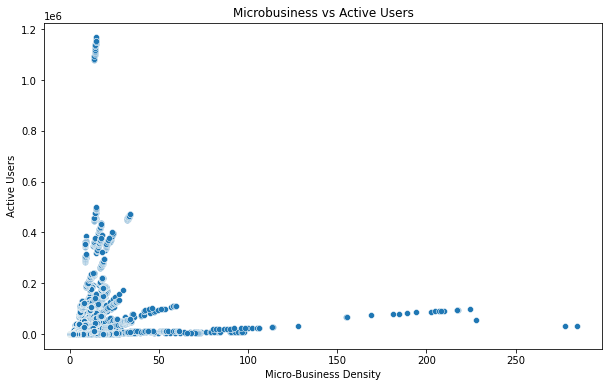

In [33]:
plt.figure(figsize = (10,6))
sns.scatterplot(x = train_df.microbusiness_density, y = train_df.active)
plt.xlabel("Micro-Business Density")
plt.ylabel("Active Users")
plt.title("Microbusiness vs Active Users")
plt.show();

**Observation**
- Even for less active users the Microbusiness Density is very high.
- Well it looks like once user has made his presence known the business will pick up and having high number of active users dosen't mak necessary that Micro-Business Density will be high
- Another factor to be look on is the less active users may have highly populated county may indicate why density is very high.

In [34]:
density_by_county = train_df.groupby(by = ['month_year','state', 'county'])[['active','microbusiness_density']].median().reset_index()
density_by_county

,month_year,state,county,active,microbusiness_density
0,2019-08,Alabama,Autauga County,1249,3.007682
1,2019-08,Alabama,Baldwin County,11464,7.239156
2,2019-08,Alabama,Barbour County,222,1.073138
3,2019-08,Alabama,Bibb County,234,1.310777
4,2019-08,Alabama,Blount County,681,1.544148
...,...,...,...,...,...
122260,2022-10,Wyoming,Sweetwater County,905,2.823801
122261,2022-10,Wyoming,Teton County,5035,26.273220
122262,2022-10,Wyoming,Uinta County,582,4.009369
122263,2022-10,Wyoming,Washakie County,189,3.126551


**Observation**
- This above table explains the Scatterplot above for which we got for low active users density of Micro-Businesses were low.
- Also, we can see for county `Baldwin we got 11,464 active users` for which `micro-business density is low` and for `Teton County` we got `5035 active users and density is high`.

## Micreobusiness Density trend over the period

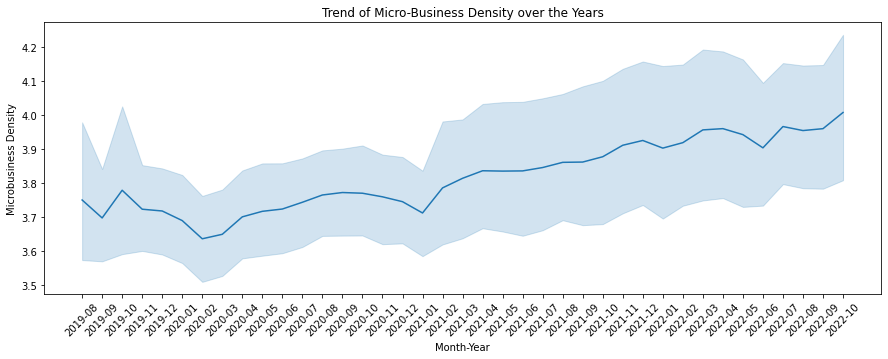

In [35]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=train_df,x=train_df.month_year.astype('str'),y='microbusiness_density')
plt.xticks(rotation = 45)
plt.xlabel("Month-Year")
plt.ylabel("Microbusiness Density")
plt.title("Trend of Micro-Business Density over the Years")
plt.show();

- From above plot it looks like the micro-business density is growing over the year we can see some short fall during `12-2019 to 2-2020` and again at `end of 2020 and starting of 2021`
- lets try to smooth out the above trend using`.rolling`

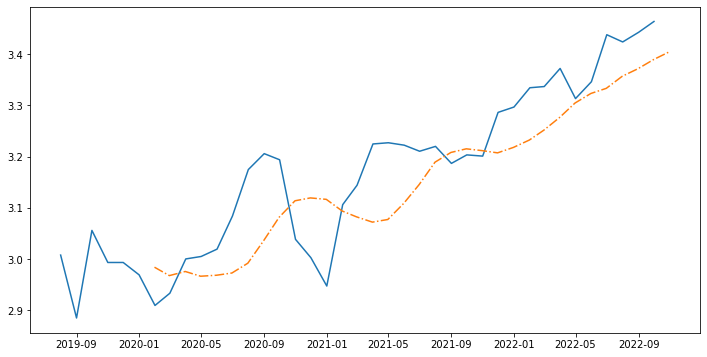

In [36]:
v_1001 = train_df[(train_df["cfips"] == 1001 ) ]
v_1001 = v_1001[['month_year', 'microbusiness_density']]
v_1001.columns = ['ds','y']
v_1001

smoothed_time_series = v_1001.rolling(window=6, center=False).mean()
smoothed_time_series

plt.figure(figsize = (12,6))
plt.plot(v_1001['ds'].dt.to_timestamp(), v_1001['y'])
plt.plot(v_1001['ds'], smoothed_time_series['y'], '-.')
plt.show()

Lets add moving average as a seprate column which smooths the data

In [37]:
# create function for MA and EWM
#SMA and EMA are both commonly-used trend indicators. SMA gives equal weight to all data points,  while EMA applies more weight to recent data points. 

def moving_average(df,i, n):
    MA = pd.Series(df[i].rolling(n, min_periods=n).mean(), name = 'MA_' + str(n))
    df = df.join(MA)
    return df

def weighted_moving_average(df,i, n):
    EMA = pd.Series(df[i].ewm(span=n, adjust=False, min_periods=n).mean(), name = 'EMA_' + str(n))
    df = df.join(EMA)
    return df

In [38]:
# create Moving Average variable.
train_df = moving_average(train_df, 'microbusiness_density', 3)
train_df = moving_average(train_df, 'microbusiness_density', 6)

# actually it's Exponential Moving Average. 
train_df = weighted_moving_average(train_df, 'microbusiness_density', 3)
train_df = weighted_moving_average(train_df, 'microbusiness_density', 6)

In [39]:
train_df

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,month_year,year,month,MA_3,MA_6,EMA_3,EMA_6
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019-08,2019,8,NaN,NaN,NaN,NaN
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019-09,2019,9,NaN,NaN,NaN,NaN
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019-10,2019,10,2.982798,NaN,3.001060,NaN
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019-11,2019,11,2.977982,NaN,2.997146,NaN
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019-12,2019,12,3.014103,NaN,2.995190,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022-06,2022,6,1.791347,1.773493,1.793318,1.777264
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022-07,2022,7,1.803250,1.782420,1.798284,1.784688
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022-08,2022,8,1.797298,1.788371,1.791840,1.784890
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022-09,2022,9,1.791347,1.791347,1.788618,1.785035


In [40]:
def predict_moving_average(df):
    temp_df = df[(df['year'] == 2021) | (train_df['year'] == 2022)][['cfips', 'year', 'month', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6' ]]
    temp_df.reset_index(drop = True, inplace = True)
    temp_df.drop(columns = ['year'], inplace = True)
    tmp_df = temp_df.groupby(by = ['cfips', 'month']).max().reset_index()
    tmp_df = pd.merge(test_df, tmp_df, how = 'left', left_on = ['cfips', 'month'], right_on = ['cfips', 'month'])
    return tmp_df

In [41]:
test_df = predict_moving_average(train_df)
test_df

,row_id,cfips,first_day_of_month,month_year,year,month,MA_3,MA_6,EMA_3,EMA_6
0,1001_2022-11-01,1001,2022-11-01,2022-11,2022,11,3.196997,3.207271,3.201476,3.196762
1,1001_2022-12-01,1001,2022-12-01,2022-12,2022,12,3.230192,3.217941,3.243891,3.222346
2,1001_2023-01-01,1001,2023-01-01,2023-01,2023,1,3.261345,3.232332,3.270336,3.243613
3,1001_2023-02-01,1001,2023-02-01,2023-02,2023,2,3.305840,3.251418,3.302384,3.269561
4,1001_2023-03-01,1001,2023-03-01,2023-03,2023,3,3.322666,3.276429,3.319584,3.288768
...,...,...,...,...,...,...,...,...,...,...
25075,56045_2023-02-01,56045,2023-02-01,2023-02,2023,2,1.765225,1.735855,1.751474,1.737702
25076,56045_2023-03-01,56045,2023-03-01,2023-03,2023,3,1.755639,1.749025,1.759508,1.746228
25077,56045_2023-04-01,56045,2023-04-01,2023-04,2023,4,1.761590,1.765189,1.763525,1.752317
25078,56045_2023-05-01,56045,2023-05-01,2023-05,2023,5,1.779444,1.772335,1.783387,1.766869


### Let's try to visualize it by state

In [42]:
def q1(x):
    return x.quantile(0.25)

def q2(x):
    return x.quantile(0.5)

def q3(x):
    return x.quantile(0.75)

In [43]:
train_df.groupby('state').agg(['mean', 'std', 'median', 'min', q1, q2, q3, 'max'])['microbusiness_density'].style.background_gradient(cmap = 'YlGnBu')

,mean,std,median,min,q1,q2,q3,max
state,,,,,,,,
Alabama,2.223274,1.584220,1.639288,0.438305,1.202177,1.639288,2.709124,8.573463
Alaska,4.426646,3.353951,3.882430,0.300300,1.870879,3.882430,5.568720,23.022598
Arizona,4.932729,3.221872,4.343054,1.179898,2.391079,4.343054,5.801554,14.872830
Arkansas,1.998925,1.497099,1.531890,0.247328,0.974982,1.531890,2.445632,16.291933
California,7.555675,4.560702,6.233485,1.497465,3.738137,6.233485,11.071931,20.285410
Colorado,8.722268,9.564177,6.123718,0.550683,3.070270,6.123718,11.309524,97.696014
Connecticut,7.107431,3.231870,6.807685,3.492040,4.515482,6.807685,7.561495,16.325758
Delaware,18.184607,14.402883,14.675447,4.995701,6.256529,14.675447,22.800505,59.590317
District of Columbia,13.508989,0.294487,13.551914,12.787801,13.269190,13.551914,13.697423,14.005946


**Observation**
>- 1. It's looking like for some state the outlier are too high like Nevada, South Dakota, Wyoming
>- 2. we need to observe the distribution of every state because Nevada and Wyoming have huge std-deviation and will try to look which of the county of different state are at ouliers or at bare minimum threshold of 99th perentile 

### visualizing the distribution of micro-business density over the year for different state

In [44]:
train_df.state.nunique()

51

In [45]:
def statedistribution(df):
    plt.figure(figsize=(20, 80))
    plt.subplots_adjust(hspace=0.5)
    plt.suptitle("Distribution of Micro-Business Density by State", fontsize=18, y=0.95)
    
    for n, i in enumerate(df.state.unique()):
        # add a new subplot iteratively
        ax = plt.subplot(19, 3, n + 1)

        # filter df and plot ticker on the new subplot axis
        df[df['state'] == i]['microbusiness_density'].plot.hist(x = 'microbusiness_density', alpha=0.5, ax = ax)
    
        # chart formatting
        ax.set_title(i)

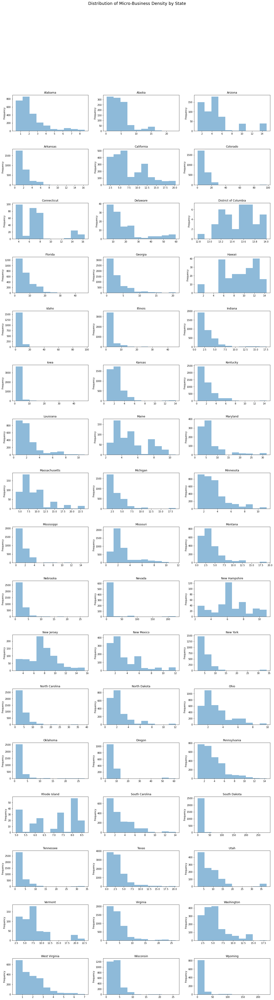

In [46]:
statedistribution(train_df)

## Looking at microbusiness density by county and state

In [47]:
mean_df = train_df.groupby(['cfips','county', 'state']).mean().reset_index().drop(['year', 'month'], axis = 1)
mean_df.style.background_gradient(cmap = 'YlGnBu', subset = ['microbusiness_density','active','MA_3','MA_6','EMA_3','EMA_6'])

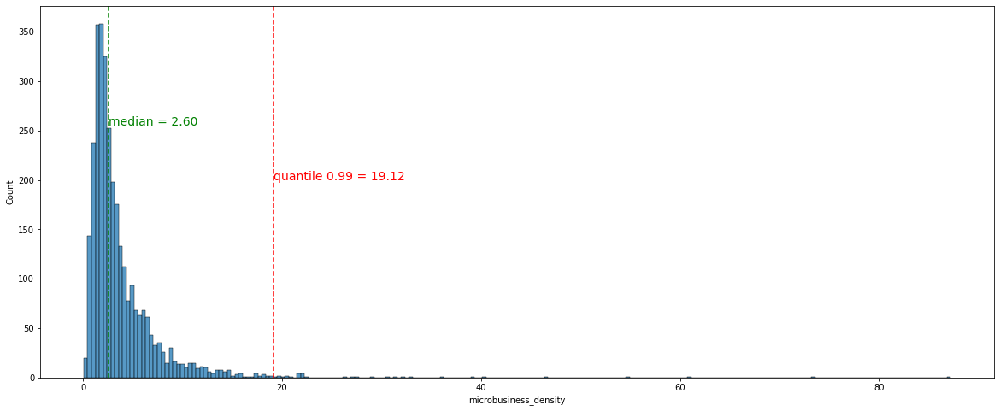

In [48]:
fig, ax = plt.subplots(1,1, figsize=(20,8))
sns.histplot(data=mean_df, x='microbusiness_density', ax=ax)

raw_median = mean_df['microbusiness_density'].median()
ax.axvline(raw_median, 0, c='green', ls='--')
ax.text(raw_median, 255, f"median = {raw_median:.2f}", size=14, horizontalalignment='left', c='green')

q99 = mean_df['microbusiness_density'].quantile(0.99)
ax.axvline(q99, 0, c='red', ls='--')
ax.text(q99, 200, f"quantile 0.99 = {q99:.2f}", size=14, c='red')

plt.show()

Data is highly postively-skewed which means a lot density of micro-business is coming from less than 1% of data.

Lets try to find which are the top counties

In [49]:
tail = mean_df[mean_df['microbusiness_density']>q99]
print(f'Number of counties in the tail: {len(tail)}')

Number of counties in the tail: 32


In [50]:
mean_df.sort_values(by='microbusiness_density', ascending = False).head(32).style.background_gradient(subset = ['microbusiness_density','active'])

,cfips,county,state,microbusiness_density,active,MA_3,MA_6,EMA_3,EMA_6
1760,32510,Carson City,Nevada,87.196625,38078.384615,86.959094,86.601387,86.790998,84.169718
3128,56033,Sheridan County,Wyoming,73.510410,17455.794872,68.602895,63.742260,69.128722,64.283891
295,8105,Rio Grande County,Colorado,60.942899,5305.948718,58.628084,55.067185,58.608322,55.105356
2235,41061,Union County,Oregon,54.522958,11141.538462,53.032569,50.805580,53.035447,50.832257
559,16021,Boundary County,Idaho,46.730638,4276.282051,44.461843,41.140696,44.488305,41.308096
1752,32017,Lincoln County,Nevada,40.140351,1695.589744,38.483047,35.941903,38.469285,35.894764
837,19101,Jefferson County,Iowa,39.112656,5803.230769,37.981941,36.292156,37.984598,36.322494
2794,49043,Summit County,Utah,35.871770,11004.333333,35.002421,33.720915,35.007410,33.729548
1855,36061,New York County,New York,32.892037,460102.051282,32.338663,31.519334,32.341497,31.523541
2407,46099,Minnehaha County,South Dakota,32.261295,45412.897436,31.416866,30.157077,31.418624,30.162987


In [51]:
fig = px.bar(mean_df.sort_values(by='microbusiness_density', ascending = False).head(30), x='state',
             y='microbusiness_density', text_auto='.2s', color = 'county', title = 'Micro-Business Density By State')
fig.update_layout(showlegend=False, xaxis_title="State", yaxis_title="Micro-Business Density")
fig.show()

**Observation**
- Very clearly visible that Density is very high for `Nevada`, `Wyoming` & `Colorado`.

In [52]:
train_df['national_avg'] = train_df.groupby(['year','month'])['microbusiness_density'].transform('mean')
train_df['state_avg'] = train_df.groupby(['state','year','month'])['microbusiness_density'].transform('mean')

In [53]:
train_df

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,month_year,year,month,MA_3,MA_6,EMA_3,EMA_6,national_avg,state_avg
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019-08,2019,8,NaN,NaN,NaN,NaN,3.749621,2.132323
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019-09,2019,9,NaN,NaN,NaN,NaN,3.696846,2.124727
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019-10,2019,10,2.982798,NaN,3.001060,NaN,3.778263,2.129766
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019-11,2019,11,2.977982,NaN,2.997146,NaN,3.722510,2.149763
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019-12,2019,12,3.014103,NaN,2.995190,NaN,3.717284,2.146385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022-06,2022,6,1.791347,1.773493,1.793318,1.777264,3.902961,10.649000
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022-07,2022,7,1.803250,1.782420,1.798284,1.784688,3.965593,10.791400
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022-08,2022,8,1.797298,1.788371,1.791840,1.784890,3.953798,10.752030
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022-09,2022,9,1.791347,1.791347,1.788618,1.785035,3.959358,11.413265


In [54]:
def predict_national_state_average(df):
    temp_df = df[(df['year'] == 2021) | (train_df['year'] == 2022)][['cfips', 'year', 'month', 'national_avg', 'state_avg']]
    temp_df.reset_index(drop = True, inplace = True)
    temp_df.drop(columns = ['year'], inplace = True)
    tmp_df = temp_df.groupby(by = ['cfips', 'month']).mean().reset_index()
    new_df = pd.merge(test_df, tmp_df, how = 'left', left_on = ['cfips', 'month'], right_on = ['cfips', 'month'])
    return new_df

In [55]:
test_df = predict_national_state_average(train_df)
test_df

,row_id,cfips,first_day_of_month,month_year,year,month,MA_3,MA_6,EMA_3,EMA_6,national_avg,state_avg
0,1001_2022-11-01,1001,2022-11-01,2022-11,2022,11,3.196997,3.207271,3.201476,3.196762,3.910580,2.271062
1,1001_2022-12-01,1001,2022-12-01,2022-12,2022,12,3.230192,3.217941,3.243891,3.222346,3.924642,2.266430
2,1001_2023-01-01,1001,2023-01-01,2023-01,2023,1,3.261345,3.232332,3.270336,3.243613,3.806798,2.210177
3,1001_2023-02-01,1001,2023-02-01,2023-02,2023,2,3.305840,3.251418,3.302384,3.269561,3.851681,2.216478
4,1001_2023-03-01,1001,2023-03-01,2023-03,2023,3,3.322666,3.276429,3.319584,3.288768,3.884594,2.234286
...,...,...,...,...,...,...,...,...,...,...,...,...
25075,56045_2023-02-01,56045,2023-02-01,2023-02,2023,2,1.765225,1.735855,1.751474,1.737702,3.851681,9.784468
25076,56045_2023-03-01,56045,2023-03-01,2023-03,2023,3,1.755639,1.749025,1.759508,1.746228,3.884594,9.927909
25077,56045_2023-04-01,56045,2023-04-01,2023-04,2023,4,1.761590,1.765189,1.763525,1.752317,3.897512,9.934326
25078,56045_2023-05-01,56045,2023-05-01,2023-05,2023,5,1.779444,1.772335,1.783387,1.766869,3.888185,9.905815


## Correlation

In [56]:
train_df.corr()

,cfips,microbusiness_density,active,year,month,MA_3,MA_6,EMA_3,EMA_6,national_avg,state_avg
cfips,1.000000e+00,-0.011767,-0.062760,-6.788227e-18,2.174404e-18,-0.012131,-0.012403,-0.012233,-0.012627,-1.960948e-18,-0.030523
microbusiness_density,-1.176709e-02,1.000000,0.316981,1.702471e-02,2.121343e-03,0.968237,0.926138,0.980866,0.950230,2.002566e-02,0.394985
active,-6.275991e-02,0.316981,1.000000,4.035053e-03,4.860858e-04,0.318798,0.314384,0.321594,0.320411,4.375800e-03,0.184251
year,-6.788227e-18,0.017025,0.004035,1.000000e+00,-3.257756e-01,0.014432,0.010761,0.014752,0.011578,8.501448e-01,0.043102
month,2.174404e-18,0.002121,0.000486,-3.257756e-01,1.000000e+00,0.002590,0.003569,0.002562,0.002711,1.059313e-01,0.005371
MA_3,-1.213144e-02,0.968237,0.318798,1.443238e-02,2.590447e-03,1.000000,0.976701,0.996784,0.987863,1.790033e-02,0.402757
MA_6,-1.240260e-02,0.926138,0.314384,1.076088e-02,3.569148e-03,0.976701,1.000000,0.976589,0.995147,1.520464e-02,0.406302
EMA_3,-1.223318e-02,0.980866,0.321594,1.475176e-02,2.562060e-03,0.996784,0.976589,1.000000,0.989381,1.830312e-02,0.406332
EMA_6,-1.262727e-02,0.950230,0.320411,1.157750e-02,2.710672e-03,0.987863,0.995147,0.989381,1.000000,1.543742e-02,0.413799
national_avg,-1.960948e-18,0.020026,0.004376,8.501448e-01,1.059313e-01,0.017900,0.015205,0.018303,0.015437,1.000000e+00,0.050700


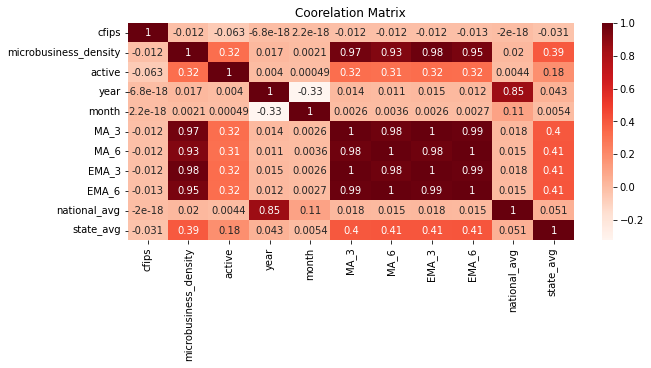

In [57]:
plt.figure(figsize = (10,4))
sns.heatmap(train_df.corr(), cmap = 'Reds', annot=True)
plt.title('Coorelation Matrix');

It will be intresting to see merge of census data and impact of different economic terms trend with microbusiness-density

In [58]:
corr_train = train_df[train_df['year'] == 2021][['cfips', 'year','microbusiness_density']].groupby('cfips').mean().reset_index()
corr_train

,cfips,year,microbusiness_density
0,1001,2021,3.181585
1,1003,2021,7.953070
2,1005,2021,1.117815
3,1007,2021,1.241929
4,1009,2021,1.709300
...,...,...,...
3130,56037,2021,3.364974
3131,56039,2021,25.707639
3132,56041,2021,3.500850
3133,56043,2021,3.092798


In [59]:
def pivot_census(category):
    """This function prepares and melts the census dataframe"""
    
    df_cols = [col for col in census_raw_df.columns if category in col]  # select relevant columns
    df = census_raw_df[df_cols+['cfips']] # subset the dataframe
    # renaming columns
    df_cols = [col[-4:] for col in df.drop('cfips', axis=1).columns]
    df.columns = df_cols+['cfips']
    # melting a dataframe
    df = pd.melt(df, id_vars='cfips', value_vars=['2017','2018','2019','2020','2021'],
                    var_name='year', value_name=category).sort_values('cfips').reset_index(drop=True)
    return df

pct_dd_df = pivot_census('pct_bb')
pct_dd_df.head()

,cfips,year,pct_bb
0,1001,2017,76.6
1,1001,2019,80.6
2,1001,2020,82.7
3,1001,2021,85.5
4,1001,2018,78.9


In [60]:
pct_dd_df.cfips.nunique()

3142

In [61]:
pct_dd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15710 entries, 0 to 15709
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   cfips   15710 non-null  int64  
 1   year    15710 non-null  object 
 2   pct_bb  15710 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 368.3+ KB


In [62]:
pct_college_df = pivot_census('pct_college')
pct_foreign_born_df = pivot_census('pct_foreign_born')
pct_it_workers_df = pivot_census('pct_it_workers')
median_hh_inc_df = pivot_census('median_hh_inc')

In [63]:
tmp = pd.merge(pct_dd_df, pct_college_df, on=['cfips','year'])
tmp = pd.merge(tmp, pct_foreign_born_df, on=['cfips','year'])
tmp = pd.merge(tmp, pct_it_workers_df, on=['cfips','year'])
census_df = pd.merge(tmp, median_hh_inc_df, on=['cfips','year'])
census_df.sort_values(['cfips','year'], inplace=True)
census_df

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001,2017,76.6,14.5,2.1,1.3,55317.0
4,1001,2018,78.9,15.9,2.0,1.1,58786.0
1,1001,2019,80.6,16.1,2.3,0.7,58731.0
2,1001,2020,82.7,16.7,2.3,0.6,57982.0
3,1001,2021,85.5,16.4,2.1,1.1,62660.0
...,...,...,...,...,...,...,...
15707,56045,2017,71.1,14.1,3.8,0.6,59605.0
15706,56045,2018,73.3,13.5,4.1,0.6,52867.0
15708,56045,2019,76.8,13.4,1.7,0.0,57031.0
15705,56045,2020,79.7,12.7,2.3,0.0,53333.0


In [64]:
census_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15710 entries, 0 to 15709
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cfips             15710 non-null  int64  
 1   year              15710 non-null  object 
 2   pct_bb            15710 non-null  float64
 3   pct_college       15710 non-null  float64
 4   pct_foreign_born  15710 non-null  float64
 5   pct_it_workers    15710 non-null  float64
 6   median_hh_inc     15710 non-null  float64
dtypes: float64(5), int64(1), object(1)
memory usage: 981.9+ KB


In [65]:
census_df['year'] = census_df['year'].astype('int64')

In [66]:
census_df

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001,2017,76.6,14.5,2.1,1.3,55317.0
4,1001,2018,78.9,15.9,2.0,1.1,58786.0
1,1001,2019,80.6,16.1,2.3,0.7,58731.0
2,1001,2020,82.7,16.7,2.3,0.6,57982.0
3,1001,2021,85.5,16.4,2.1,1.1,62660.0
...,...,...,...,...,...,...,...
15707,56045,2017,71.1,14.1,3.8,0.6,59605.0
15706,56045,2018,73.3,13.5,4.1,0.6,52867.0
15708,56045,2019,76.8,13.4,1.7,0.0,57031.0
15705,56045,2020,79.7,12.7,2.3,0.0,53333.0


### Let's visualize thr trajectory of each this measurment over th years

In [67]:
us_census = census_df.drop('cfips', axis=1).groupby('year').mean().reset_index()
us_census

,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,2017,69.920401,13.813399,4.702451,1.427148,49754.163908
1,2018,72.690866,14.005379,4.724507,1.382272,51575.375239
2,2019,75.398600,14.240452,4.769096,1.338956,53475.909612
3,2020,78.540420,14.630108,4.749523,1.309484,55012.338956
4,2021,80.535996,14.850350,4.744526,1.272533,58228.121897


In [68]:
import plotly.express as px
category = ['pct_bb', 'pct_college', 'pct_foreign_born', 'pct_it_workers', 'median_hh_inc']
for cat in category:
    fig = px.line(us_census, x = 'year', y = cat)
    fig.show()

**Observation**
- Pecentage of people with access to `broadband connection` are `increasing` every year `by 2%`.
- Percent of `youth completing college with a degree` are incrasing very steadily by `0.2` on an average there was little shar inccrease in 2019-2020 but again dropped down in 2020-2021
- Percent of `foreign born` was `increasing till 2019` but `after` that it is `decreasing`.
- Percent of `IT workers` in US are are `decreasing steadily`.
- Percent of `Household income` are `increasing` sharply.

### Correlation between Census and MicroBusiness Data

Let's try to visualize the correraltion for the year 2021 with microbusiness_density along with census

In [69]:
train_2021_df = train_df[train_df['year'] == 2021][['cfips','microbusiness_density']].groupby('cfips').mean()
train_2021_df.reset_index(inplace=True)
train_2021_df

,cfips,microbusiness_density
0,1001,3.181585
1,1003,7.953070
2,1005,1.117815
3,1007,1.241929
4,1009,1.709300
...,...,...
3130,56037,3.364974
3131,56039,25.707639
3132,56041,3.500850
3133,56043,3.092798


In [70]:
census_df['year'] = census_df['year'].astype(int)
census_df_2021 = census_df[census_df['year']==2021]
census_df_2021

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
3,1001,2021,85.5,16.4,2.1,1.1,62660.0
9,1003,2021,87.9,20.6,3.5,1.3,64346.0
14,1005,2021,64.6,6.7,2.6,0.8,36422.0
15,1007,2021,74.6,7.9,1.1,2.1,54277.0
23,1009,2021,81.0,9.3,4.5,0.9,52830.0
...,...,...,...,...,...,...,...
15686,56037,2021,88.4,12.4,5.5,1.0,76668.0
15690,56039,2021,90.5,38.3,11.1,2.0,94498.0
15696,56041,2021,90.6,12.3,2.9,0.9,75106.0
15703,56043,2021,85.4,17.2,1.0,1.1,62271.0


In [71]:
corelations_2021 = census_df_2021.merge(train_2021_df, on='cfips').drop('year', axis=1).set_index('cfips')
corelations_2021

,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc,microbusiness_density
cfips,,,,,,
1001,85.5,16.4,2.1,1.1,62660.0,3.181585
1003,87.9,20.6,3.5,1.3,64346.0,7.953070
1005,64.6,6.7,2.6,0.8,36422.0,1.117815
1007,74.6,7.9,1.1,2.1,54277.0,1.241929
1009,81.0,9.3,4.5,0.9,52830.0,1.709300
...,...,...,...,...,...,...
56037,88.4,12.4,5.5,1.0,76668.0,3.364974
56039,90.5,38.3,11.1,2.0,94498.0,25.707639
56041,90.6,12.3,2.9,0.9,75106.0,3.500850


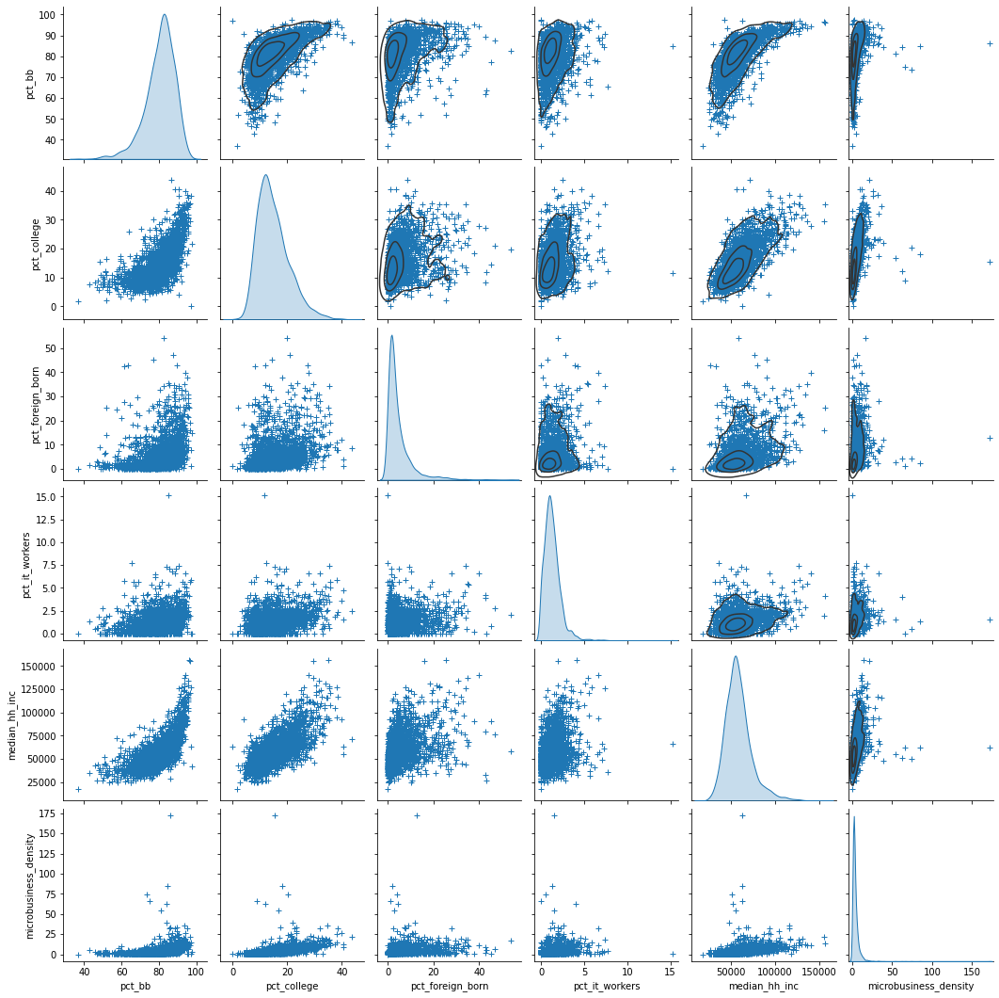

In [72]:
g = sns.pairplot(data=corelations_2021, diag_kind="kde", plot_kws=dict(marker="+", linewidth=1))
g.map_upper(sns.kdeplot, levels=4, color=".2")
plt.show()

We can remove outliers to more clearly see and calculate the correlations (Pearson's). And as we're interested mostly in microbusiness_density I'll plot only its correlation with other variables now.

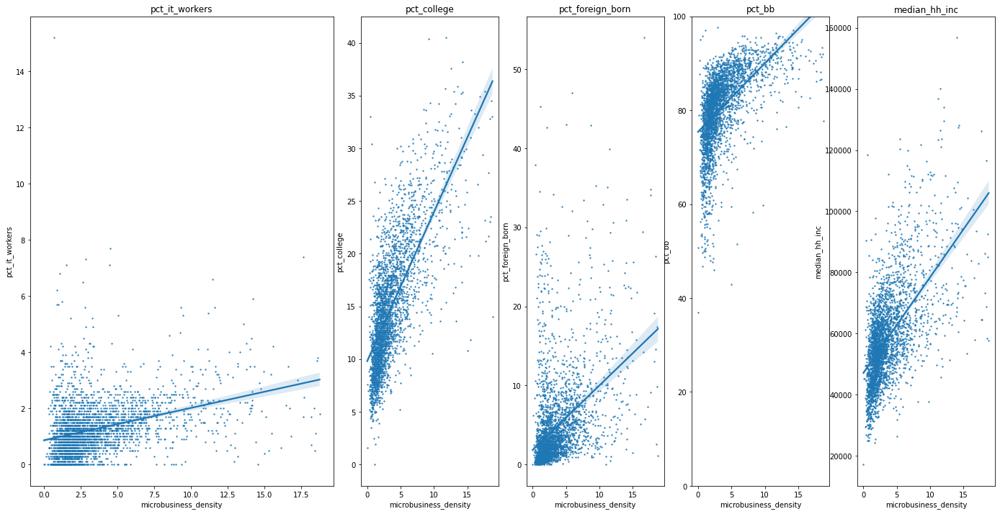

In [73]:

corr_clean = corelations_2021[corelations_2021['microbusiness_density']<q99]
# print(corelations)

fig, axes = plt.subplot_mosaic(('AAB;DE'), figsize=(24,12))
cat = ['pct_bb', 'pct_college', 'pct_foreign_born', 'pct_it_workers', 'median_hh_inc']

for i, ax in enumerate(axes.values()):
    if i==0: ax.set_ylim([None,100])
    sns.regplot(data = corr_clean, x='microbusiness_density', scatter_kws={'s':2}, y=cat[i], ax=ax)
    ax.set_title(cat[i])

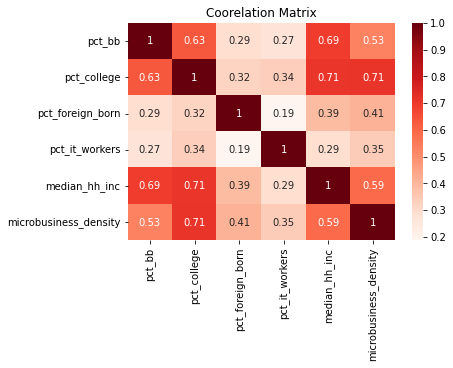

In [74]:
sns.heatmap(corr_clean.corr(), cmap = 'Reds', annot=True)
plt.title('Coorelation Matrix');

**Observation**
From the graphs and a table above we can conclude that microbusiness_density:

- grows with the increasing access to the broadband Internet but saturates above ca. 80% (Pearson's = 0.53)
- grows with the increased percentage of people with a college degree (Pearson's = 0.71)
- has a heteroscedasticity in relation to foreign born people - showing also a weak correlation (Pearson's = 0.41)
- has a weak incresaing trend for percentage of IT workers (Pearson's = 0.34)
- has a moderate but heteroscedastic correlation with the median houshold income (Pearson's = 0.59)

In [75]:
census_df.year.unique()

array([2017, 2018, 2019, 2020, 2021])

In the census we've data only till 2021 but in training data we want till 2022. so we will forecast the vale for census of 2022 by unsing previous year growth rate.

In [76]:
census_df

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001,2017,76.6,14.5,2.1,1.3,55317.0
4,1001,2018,78.9,15.9,2.0,1.1,58786.0
1,1001,2019,80.6,16.1,2.3,0.7,58731.0
2,1001,2020,82.7,16.7,2.3,0.6,57982.0
3,1001,2021,85.5,16.4,2.1,1.1,62660.0
...,...,...,...,...,...,...,...
15707,56045,2017,71.1,14.1,3.8,0.6,59605.0
15706,56045,2018,73.3,13.5,4.1,0.6,52867.0
15708,56045,2019,76.8,13.4,1.7,0.0,57031.0
15705,56045,2020,79.7,12.7,2.3,0.0,53333.0


In [77]:
census_df[census_df['year'] >= 2019]

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
1,1001,2019,80.6,16.1,2.3,0.7,58731.0
2,1001,2020,82.7,16.7,2.3,0.6,57982.0
3,1001,2021,85.5,16.4,2.1,1.1,62660.0
6,1003,2019,81.8,21.0,3.7,1.4,58320.0
7,1003,2020,85.1,20.2,3.4,1.0,61756.0
...,...,...,...,...,...,...,...
15701,56043,2020,82.8,15.0,2.2,0.9,57306.0
15703,56043,2021,85.4,17.2,1.0,1.1,62271.0
15708,56045,2019,76.8,13.4,1.7,0.0,57031.0
15705,56045,2020,79.7,12.7,2.3,0.0,53333.0


In [78]:
import warnings
warnings.filterwarnings("ignore")

In [79]:
def census_predict(census_df, Yr):
    census_pct_change = census_df.set_index(['cfips', 'year']).unstack(['cfips']).pct_change().stack(['cfips']).reset_index().reindex(columns = ['cfips','year','pct_bb','pct_college','pct_foreign_born','pct_it_workers','median_hh_inc'])
    census_pct_change.sort_values(by = ['cfips', 'year'],inplace=True)
    census_pct_change.reset_index(drop = True)
    census_lst_year_gr = census_pct_change[census_pct_change['year'] == Yr]
    keep_same = {'cfips', 'year'}
    census_lst_year_gr.columns = ['{}{}'.format(c, '' if c in keep_same else '_gr') for c in census_lst_year_gr.columns]
    census_lst_year_gr.drop(['year'], axis = 1, inplace = True)
    census_lst_year_gr.replace(np.inf, np.nan, inplace=True)
    census_lst_year = census_df[census_df['year']==Yr]
    census_df_latest = pd.merge(census_lst_year, census_lst_year_gr, on = ['cfips'])
    census_df_latest['year'] = Yr+1
    census_columns = census_df_latest.iloc[:,2:7].columns.tolist()
    for column in census_columns:
        census_df_latest[column] = census_df_latest[column] + (census_df_latest[column] * census_df_latest[column+'_gr'])
        census_df_latest.drop([column+'_gr'], axis = 1, inplace = True)
    predicted_census_df = pd.concat([census_df,census_df_latest])
    predicted_census_df.sort_values(by = ['cfips','year'], inplace=True)
    predicted_census_df.reset_index(drop=True)
    return predicted_census_df

In [80]:
update_census_df = census_predict(census_df = census_df, Yr = 2021)
update_census_df.reset_index(inplace = True, drop = True)

In [81]:
update_census_df

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001,2017,76.60000,14.500000,2.100000,1.3,55317.000000
1,1001,2018,78.90000,15.900000,2.000000,1.1,58786.000000
2,1001,2019,80.60000,16.100000,2.300000,0.7,58731.000000
3,1001,2020,82.70000,16.700000,2.300000,0.6,57982.000000
4,1001,2021,85.50000,16.400000,2.100000,1.1,62660.000000
...,...,...,...,...,...,...,...
18847,56045,2018,73.30000,13.500000,4.100000,0.6,52867.000000
18848,56045,2019,76.80000,13.400000,1.700000,0.0,57031.000000
18849,56045,2020,79.70000,12.700000,2.300000,0.0,53333.000000
18850,56045,2021,81.30000,13.900000,1.600000,0.0,65566.000000


In [82]:
#Let's cross check the number of rows added new
census_df.shape[0] + census_df_2021.shape[0]

18852

In [83]:
update_census_df.describe().T

,count,mean,std,min,25%,50%,75%,max
cfips,18852.0,30383.649268,15160.497404,1001.000000,18177.0,29176.000,45081.000000,56045.000000
year,18852.0,2019.500000,1.707870,2017.000000,2018.0,2019.500,2021.000000,2022.000000
pct_bb,18852.0,76.619640,9.729335,24.500000,70.9,77.800,83.600000,103.316269
pct_college,18851.0,14.452082,5.788831,0.000000,10.2,13.400,17.630247,48.000000
pct_foreign_born,18829.0,4.765813,5.756951,0.000000,1.4,2.704,5.800000,57.800000
pct_it_workers,18673.0,1.368914,1.101014,0.000000,0.7,1.200,1.800000,48.400000
median_hh_inc,18852.0,54966.401253,15281.041394,10331.340875,44875.0,52784.000,61966.500000,167171.904487


Our test dataframe have the also the data for 2023 so we need to predict for that too.

In [84]:
updated_census_df = census_predict(census_df = update_census_df, Yr = 2022)
updated_census_df.reset_index(inplace = True, drop = True)

In [85]:
updated_census_df

,cfips,year,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001,2017,76.600000,14.500000,2.100000,1.3,55317.000000
1,1001,2018,78.900000,15.900000,2.000000,1.1,58786.000000
2,1001,2019,80.600000,16.100000,2.300000,0.7,58731.000000
3,1001,2020,82.700000,16.700000,2.300000,0.6,57982.000000
4,1001,2021,85.500000,16.400000,2.100000,1.1,62660.000000
...,...,...,...,...,...,...,...
21989,56045,2019,76.800000,13.400000,1.700000,0.0,57031.000000
21990,56045,2020,79.700000,12.700000,2.300000,0.0,53333.000000
21991,56045,2021,81.300000,13.900000,1.600000,0.0,65566.000000
21992,56045,2022,82.932120,15.213386,1.113043,NaN,80604.885456


In [86]:
train_df

,row_id,cfips,county,state,first_day_of_month,microbusiness_density,active,month_year,year,month,MA_3,MA_6,EMA_3,EMA_6,national_avg,state_avg
0,1001_2019-08-01,1001,Autauga County,Alabama,2019-08-01,3.007682,1249,2019-08,2019,8,NaN,NaN,NaN,NaN,3.749621,2.132323
1,1001_2019-09-01,1001,Autauga County,Alabama,2019-09-01,2.884870,1198,2019-09,2019,9,NaN,NaN,NaN,NaN,3.696846,2.124727
2,1001_2019-10-01,1001,Autauga County,Alabama,2019-10-01,3.055843,1269,2019-10,2019,10,2.982798,NaN,3.001060,NaN,3.778263,2.129766
3,1001_2019-11-01,1001,Autauga County,Alabama,2019-11-01,2.993233,1243,2019-11,2019,11,2.977982,NaN,2.997146,NaN,3.722510,2.149763
4,1001_2019-12-01,1001,Autauga County,Alabama,2019-12-01,2.993233,1243,2019-12,2019,12,3.014103,NaN,2.995190,NaN,3.717284,2.146385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,Weston County,Wyoming,2022-06-01,1.803249,101,2022-06,2022,6,1.791347,1.773493,1.793318,1.777264,3.902961,10.649000
122261,56045_2022-07-01,56045,Weston County,Wyoming,2022-07-01,1.803249,101,2022-07,2022,7,1.803250,1.782420,1.798284,1.784688,3.965593,10.791400
122262,56045_2022-08-01,56045,Weston County,Wyoming,2022-08-01,1.785396,100,2022-08,2022,8,1.797298,1.788371,1.791840,1.784890,3.953798,10.752030
122263,56045_2022-09-01,56045,Weston County,Wyoming,2022-09-01,1.785396,100,2022-09,2022,9,1.791347,1.791347,1.788618,1.785035,3.959358,11.413265


In [87]:
train_df.columns

Index(['row_id', 'cfips', 'county', 'state', 'first_day_of_month',
       'microbusiness_density', 'active', 'month_year', 'year', 'month',
       'MA_3', 'MA_6', 'EMA_3', 'EMA_6', 'national_avg', 'state_avg'],
      dtype='object')

In [88]:
def predict_active(df):    
    new_df = pd.DataFrame()
    for cfip in tqdm(df['cfips'].unique()):    
        td = df[df['cfips'] == cfip]
        td['pct_active'] = td['active'].pct_change()
        new_df = new_df.append(td, ignore_index = True)
    tmp_df = new_df[['cfips', 'month', 'active', 'pct_active']].groupby(by = ['cfips', 'month']).mean().reset_index()
    tmp_df['active'] = tmp_df['active'] + (tmp_df['active'] * tmp_df['pct_active'])
    tmp_df.drop(['pct_active'], axis = 1, inplace = True)
    tmp_df.replace(np.inf, np.nan, inplace=True)
    return tmp_df

In [89]:
active_df = predict_active(train_df)
active_df

100%|██████████████████████████████████████| 3135/3135 [01:53<00:00, 27.68it/s]


,cfips,month,active
0,1001,1,1295.189848
1,1001,2,1334.471436
2,1001,3,1332.992509
3,1001,4,1375.887849
4,1001,5,1335.237663
...,...,...,...
37615,56045,8,92.986680
37616,56045,9,92.232898
37617,56045,10,90.742604
37618,56045,11,94.730627


In [90]:
test_df = pd.merge(test_df, active_df,  how='left', left_on=['cfips','month'], right_on = ['cfips','month'])
test_df

,row_id,cfips,first_day_of_month,month_year,year,month,MA_3,MA_6,EMA_3,EMA_6,national_avg,state_avg,active
0,1001_2022-11-01,1001,2022-11-01,2022-11,2022,11,3.196997,3.207271,3.201476,3.196762,3.910580,2.271062,1257.997560
1,1001_2022-12-01,1001,2022-12-01,2022-12,2022,12,3.230192,3.217941,3.243891,3.222346,3.924642,2.266430,1301.416697
2,1001_2023-01-01,1001,2023-01-01,2023-01,2023,1,3.261345,3.232332,3.270336,3.243613,3.806798,2.210177,1295.189848
3,1001_2023-02-01,1001,2023-02-01,2023-02,2023,2,3.305840,3.251418,3.302384,3.269561,3.851681,2.216478,1334.471436
4,1001_2023-03-01,1001,2023-03-01,2023-03,2023,3,3.322666,3.276429,3.319584,3.288768,3.884594,2.234286,1332.992509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25075,56045_2023-02-01,56045,2023-02-01,2023-02,2023,2,1.765225,1.735855,1.751474,1.737702,3.851681,9.784468,94.044944
25076,56045_2023-03-01,56045,2023-03-01,2023-03,2023,3,1.755639,1.749025,1.759508,1.746228,3.884594,9.927909,95.679222
25077,56045_2023-04-01,56045,2023-04-01,2023-04,2023,4,1.761590,1.765189,1.763525,1.752317,3.897512,9.934326,93.724885
25078,56045_2023-05-01,56045,2023-05-01,2023-05,2023,5,1.779444,1.772335,1.783387,1.766869,3.888185,9.905815,96.071962


In [91]:
merged_df = train_df[['row_id','cfips', 'first_day_of_month' ,'month_year', 'year', 'active', 'national_avg', 'state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6', 'microbusiness_density']].merge(updated_census_df, on = ['cfips','year'], how='left')
merged_test_df = test_df[['row_id','cfips', 'first_day_of_month', 'month_year', 'year', 'active', 'national_avg', 'state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6']].merge(updated_census_df, on = ['cfips','year'], how='left')

In [92]:
merged_df

,row_id,cfips,first_day_of_month,month_year,year,active,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6,microbusiness_density,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001_2019-08-01,1001,2019-08-01,2019-08,2019,1249,3.749621,2.132323,NaN,NaN,NaN,NaN,3.007682,80.60000,16.100000,2.300000,0.7,58731.000000
1,1001_2019-09-01,1001,2019-09-01,2019-09,2019,1198,3.696846,2.124727,NaN,NaN,NaN,NaN,2.884870,80.60000,16.100000,2.300000,0.7,58731.000000
2,1001_2019-10-01,1001,2019-10-01,2019-10,2019,1269,3.778263,2.129766,2.982798,NaN,3.001060,NaN,3.055843,80.60000,16.100000,2.300000,0.7,58731.000000
3,1001_2019-11-01,1001,2019-11-01,2019-11,2019,1243,3.722510,2.149763,2.977982,NaN,2.997146,NaN,2.993233,80.60000,16.100000,2.300000,0.7,58731.000000
4,1001_2019-12-01,1001,2019-12-01,2019-12,2019,1243,3.717284,2.146385,3.014103,NaN,2.995190,NaN,2.993233,80.60000,16.100000,2.300000,0.7,58731.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,2022-06-01,2022-06,2022,101,3.902961,10.649000,1.791347,1.773493,1.793318,1.777264,1.803249,82.93212,15.213386,1.113043,NaN,80604.885456
122261,56045_2022-07-01,56045,2022-07-01,2022-07,2022,101,3.965593,10.791400,1.803250,1.782420,1.798284,1.784688,1.803249,82.93212,15.213386,1.113043,NaN,80604.885456
122262,56045_2022-08-01,56045,2022-08-01,2022-08,2022,100,3.953798,10.752030,1.797298,1.788371,1.791840,1.784890,1.785396,82.93212,15.213386,1.113043,NaN,80604.885456
122263,56045_2022-09-01,56045,2022-09-01,2022-09,2022,100,3.959358,11.413265,1.791347,1.791347,1.788618,1.785035,1.785396,82.93212,15.213386,1.113043,NaN,80604.885456


In [93]:
merged_test_df

,row_id,cfips,first_day_of_month,month_year,year,active,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001_2022-11-01,1001,2022-11-01,2022-11,2022,1257.997560,3.910580,2.271062,3.196997,3.207271,3.201476,3.196762,88.394800,16.105389,1.917391,2.016667,67715.422028
1,1001_2022-12-01,1001,2022-12-01,2022-12,2022,1301.416697,3.924642,2.266430,3.230192,3.217941,3.243891,3.222346,88.394800,16.105389,1.917391,2.016667,67715.422028
2,1001_2023-01-01,1001,2023-01-01,2023-01,2023,1295.189848,3.806798,2.210177,3.261345,3.232332,3.270336,3.243613,91.387611,15.816071,1.750662,3.697222,73178.716571
3,1001_2023-02-01,1001,2023-02-01,2023-02,2023,1334.471436,3.851681,2.216478,3.305840,3.251418,3.302384,3.269561,91.387611,15.816071,1.750662,3.697222,73178.716571
4,1001_2023-03-01,1001,2023-03-01,2023-03,2023,1332.992509,3.884594,2.234286,3.322666,3.276429,3.319584,3.288768,91.387611,15.816071,1.750662,3.697222,73178.716571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25075,56045_2023-02-01,56045,2023-02-01,2023-02,2023,94.044944,3.851681,9.784468,1.765225,1.735855,1.751474,1.737702,84.597006,16.650871,0.774291,NaN,99093.242829
25076,56045_2023-03-01,56045,2023-03-01,2023-03,2023,95.679222,3.884594,9.927909,1.755639,1.749025,1.759508,1.746228,84.597006,16.650871,0.774291,NaN,99093.242829
25077,56045_2023-04-01,56045,2023-04-01,2023-04,2023,93.724885,3.897512,9.934326,1.761590,1.765189,1.763525,1.752317,84.597006,16.650871,0.774291,NaN,99093.242829
25078,56045_2023-05-01,56045,2023-05-01,2023-05,2023,96.071962,3.888185,9.905815,1.779444,1.772335,1.783387,1.766869,84.597006,16.650871,0.774291,NaN,99093.242829


In [94]:
merged_df.isna().sum()

row_id                      0
cfips                       0
first_day_of_month          0
month_year                  0
year                        0
active                      0
national_avg                0
state_avg                   0
MA_3                        2
MA_6                        5
EMA_3                       2
EMA_6                       5
microbusiness_density       0
pct_bb                      0
pct_college                10
pct_foreign_born          230
pct_it_workers           1770
median_hh_inc               0
dtype: int64

# Train/Validation/Test Split
The data already has Train and Test split but we don't have data for census of 2022 & 2023 which will be needed for forecasting since it has good correlations. we will predict census for 2022 and 2023 and will create validation for 2022 from trainig and will impute census for 2022 and 2023 in Test.

In [95]:
len(merged_df)

122265

In [96]:
train_df= merged_df[merged_df['year'] < 2022].copy()
print("Length of validation data",len(train_df))

Length of validation data 90915


In [97]:
train_df

,row_id,cfips,first_day_of_month,month_year,year,active,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6,microbusiness_density,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001_2019-08-01,1001,2019-08-01,2019-08,2019,1249,3.749621,2.132323,NaN,NaN,NaN,NaN,3.007682,80.6,16.1,2.3,0.7,58731.0
1,1001_2019-09-01,1001,2019-09-01,2019-09,2019,1198,3.696846,2.124727,NaN,NaN,NaN,NaN,2.884870,80.6,16.1,2.3,0.7,58731.0
2,1001_2019-10-01,1001,2019-10-01,2019-10,2019,1269,3.778263,2.129766,2.982798,NaN,3.001060,NaN,3.055843,80.6,16.1,2.3,0.7,58731.0
3,1001_2019-11-01,1001,2019-11-01,2019-11,2019,1243,3.722510,2.149763,2.977982,NaN,2.997146,NaN,2.993233,80.6,16.1,2.3,0.7,58731.0
4,1001_2019-12-01,1001,2019-12-01,2019-12,2019,1243,3.717284,2.146385,3.014103,NaN,2.995190,NaN,2.993233,80.6,16.1,2.3,0.7,58731.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,56045_2021-08-01,56045,2021-08-01,2021-08,2021,93,3.860317,9.643831,1.658583,1.691515,1.667773,1.668684,1.670559,81.3,13.9,1.6,0.0,65566.0
122251,56045_2021-09-01,56045,2021-09-01,2021-09,2021,94,3.861170,9.575582,1.670559,1.679540,1.678148,1.674352,1.688522,81.3,13.9,1.6,0.0,65566.0
122252,56045_2021-10-01,56045,2021-10-01,2021-10,2021,93,3.876802,9.729388,1.676546,1.670559,1.674353,1.673268,1.670559,81.3,13.9,1.6,0.0,65566.0
122253,56045_2021-11-01,56045,2021-11-01,2021-11,2021,98,3.910580,9.958766,1.706485,1.682534,1.717363,1.698155,1.760374,81.3,13.9,1.6,0.0,65566.0


In [98]:
train_df.month_year.min(), train_df.month_year.max()

(Period('2019-08', 'M'), Period('2021-12', 'M'))

In [99]:
validation_df = merged_df[merged_df['year'] == 2022].copy()
print("Length of validation data",validation_df.shape[0])

Length of validation data 31350


In [100]:
validation_df.month_year.min(), validation_df.month_year.max()

(Period('2022-01', 'M'), Period('2022-10', 'M'))

In [101]:
validation_df

,row_id,cfips,first_day_of_month,month_year,year,active,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6,microbusiness_density,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
29,1001_2022-01-01,1001,2022-01-01,2022-01,2022,1401,3.902177,2.254350,3.261345,3.232332,3.270336,3.243613,3.296781,88.39480,16.105389,1.917391,2.016667,67715.422028
30,1001_2022-02-01,1001,2022-02-01,2022-02,2022,1417,3.918186,2.266959,3.305840,3.251418,3.302384,3.269561,3.334431,88.39480,16.105389,1.917391,2.016667,67715.422028
31,1001_2022-03-01,1001,2022-03-01,2022-03,2022,1418,3.955753,2.279665,3.322666,3.276429,3.319584,3.288768,3.336785,88.39480,16.105389,1.917391,2.016667,67715.422028
32,1001_2022-04-01,1001,2022-04-01,2022-04,2022,1433,3.959441,2.286959,3.347766,3.304556,3.345833,3.312572,3.372082,88.39480,16.105389,1.917391,2.016667,67715.422028
33,1001_2022-05-01,1001,2022-05-01,2022-05,2022,1408,3.941799,2.280250,3.340706,3.323273,3.329543,3.312766,3.313253,88.39480,16.105389,1.917391,2.016667,67715.422028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045_2022-06-01,56045,2022-06-01,2022-06,2022,101,3.902961,10.649000,1.791347,1.773493,1.793318,1.777264,1.803249,82.93212,15.213386,1.113043,NaN,80604.885456
122261,56045_2022-07-01,56045,2022-07-01,2022-07,2022,101,3.965593,10.791400,1.803250,1.782420,1.798284,1.784688,1.803249,82.93212,15.213386,1.113043,NaN,80604.885456
122262,56045_2022-08-01,56045,2022-08-01,2022-08,2022,100,3.953798,10.752030,1.797298,1.788371,1.791840,1.784890,1.785396,82.93212,15.213386,1.113043,NaN,80604.885456
122263,56045_2022-09-01,56045,2022-09-01,2022-09,2022,100,3.959358,11.413265,1.791347,1.791347,1.788618,1.785035,1.785396,82.93212,15.213386,1.113043,NaN,80604.885456


In [102]:
test_df = merged_test_df.copy()

In [103]:
test_df.month_year.min(), test_df.month_year.max()

(Period('2022-11', 'M'), Period('2023-06', 'M'))

## Inputs and Targets Column

In [104]:
train_df.columns

Index(['row_id', 'cfips', 'first_day_of_month', 'month_year', 'year', 'active',
       'national_avg', 'state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6',
       'microbusiness_density', 'pct_bb', 'pct_college', 'pct_foreign_born',
       'pct_it_workers', 'median_hh_inc'],
      dtype='object')

In [105]:
target_col =  ["cfips", "first_day_of_month", "microbusiness_density"]
input_cols = list(set(merged_df.columns) - set(['row_id', 'microbusiness_density','month_year','year','month']))
print(" Inputs Cols: \n{} \n\n Target Cols: \n{}".format(input_cols,target_col))

 Inputs Cols: 
['pct_it_workers', 'EMA_3', 'state_avg', 'active', 'EMA_6', 'first_day_of_month', 'MA_3', 'national_avg', 'MA_6', 'pct_foreign_born', 'median_hh_inc', 'pct_bb', 'pct_college', 'cfips'] 

 Target Cols: 
['cfips', 'first_day_of_month', 'microbusiness_density']


In [106]:
train_inputs = train_df[input_cols].copy().sort_values(by = ['cfips', 'first_day_of_month']).reindex(columns = ['cfips','first_day_of_month','active', 'pct_bb','pct_college','pct_it_workers','pct_foreign_born','median_hh_inc','national_avg', 'state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6'])
train_targets = train_df[target_col].copy()
print(train_targets.shape)
train_inputs

(90915, 3)


,cfips,first_day_of_month,active,pct_bb,pct_college,pct_it_workers,pct_foreign_born,median_hh_inc,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6
0,1001,2019-08-01,1249,80.6,16.1,0.7,2.3,58731.0,3.749621,2.132323,NaN,NaN,NaN,NaN
1,1001,2019-09-01,1198,80.6,16.1,0.7,2.3,58731.0,3.696846,2.124727,NaN,NaN,NaN,NaN
2,1001,2019-10-01,1269,80.6,16.1,0.7,2.3,58731.0,3.778263,2.129766,2.982798,NaN,3.001060,NaN
3,1001,2019-11-01,1243,80.6,16.1,0.7,2.3,58731.0,3.722510,2.149763,2.977982,NaN,2.997146,NaN
4,1001,2019-12-01,1243,80.6,16.1,0.7,2.3,58731.0,3.717284,2.146385,3.014103,NaN,2.995190,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,56045,2021-08-01,93,81.3,13.9,0.0,1.6,65566.0,3.860317,9.643831,1.658583,1.691515,1.667773,1.668684
122251,56045,2021-09-01,94,81.3,13.9,0.0,1.6,65566.0,3.861170,9.575582,1.670559,1.679540,1.678148,1.674352
122252,56045,2021-10-01,93,81.3,13.9,0.0,1.6,65566.0,3.876802,9.729388,1.676546,1.670559,1.674353,1.673268
122253,56045,2021-11-01,98,81.3,13.9,0.0,1.6,65566.0,3.910580,9.958766,1.706485,1.682534,1.717363,1.698155


In [107]:
train_targets

,cfips,first_day_of_month,microbusiness_density
0,1001,2019-08-01,3.007682
1,1001,2019-09-01,2.884870
2,1001,2019-10-01,3.055843
3,1001,2019-11-01,2.993233
4,1001,2019-12-01,2.993233
...,...,...,...
122250,56045,2021-08-01,1.670559
122251,56045,2021-09-01,1.688522
122252,56045,2021-10-01,1.670559
122253,56045,2021-11-01,1.760374


In [108]:
val_inputs = validation_df[input_cols].copy().reindex(columns = ['cfips','first_day_of_month','active', 'pct_bb','pct_college','pct_it_workers','pct_foreign_born','median_hh_inc','national_avg','state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6'])
val_targets = validation_df[target_col].copy()

In [109]:
val_inputs

,cfips,first_day_of_month,active,pct_bb,pct_college,pct_it_workers,pct_foreign_born,median_hh_inc,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6
29,1001,2022-01-01,1401,88.39480,16.105389,2.016667,1.917391,67715.422028,3.902177,2.254350,3.261345,3.232332,3.270336,3.243613
30,1001,2022-02-01,1417,88.39480,16.105389,2.016667,1.917391,67715.422028,3.918186,2.266959,3.305840,3.251418,3.302384,3.269561
31,1001,2022-03-01,1418,88.39480,16.105389,2.016667,1.917391,67715.422028,3.955753,2.279665,3.322666,3.276429,3.319584,3.288768
32,1001,2022-04-01,1433,88.39480,16.105389,2.016667,1.917391,67715.422028,3.959441,2.286959,3.347766,3.304556,3.345833,3.312572
33,1001,2022-05-01,1408,88.39480,16.105389,2.016667,1.917391,67715.422028,3.941799,2.280250,3.340706,3.323273,3.329543,3.312766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122260,56045,2022-06-01,101,82.93212,15.213386,NaN,1.113043,80604.885456,3.902961,10.649000,1.791347,1.773493,1.793318,1.777264
122261,56045,2022-07-01,101,82.93212,15.213386,NaN,1.113043,80604.885456,3.965593,10.791400,1.803250,1.782420,1.798284,1.784688
122262,56045,2022-08-01,100,82.93212,15.213386,NaN,1.113043,80604.885456,3.953798,10.752030,1.797298,1.788371,1.791840,1.784890
122263,56045,2022-09-01,100,82.93212,15.213386,NaN,1.113043,80604.885456,3.959358,11.413265,1.791347,1.791347,1.788618,1.785035


In [110]:
test_df

,row_id,cfips,first_day_of_month,month_year,year,active,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6,pct_bb,pct_college,pct_foreign_born,pct_it_workers,median_hh_inc
0,1001_2022-11-01,1001,2022-11-01,2022-11,2022,1257.997560,3.910580,2.271062,3.196997,3.207271,3.201476,3.196762,88.394800,16.105389,1.917391,2.016667,67715.422028
1,1001_2022-12-01,1001,2022-12-01,2022-12,2022,1301.416697,3.924642,2.266430,3.230192,3.217941,3.243891,3.222346,88.394800,16.105389,1.917391,2.016667,67715.422028
2,1001_2023-01-01,1001,2023-01-01,2023-01,2023,1295.189848,3.806798,2.210177,3.261345,3.232332,3.270336,3.243613,91.387611,15.816071,1.750662,3.697222,73178.716571
3,1001_2023-02-01,1001,2023-02-01,2023-02,2023,1334.471436,3.851681,2.216478,3.305840,3.251418,3.302384,3.269561,91.387611,15.816071,1.750662,3.697222,73178.716571
4,1001_2023-03-01,1001,2023-03-01,2023-03,2023,1332.992509,3.884594,2.234286,3.322666,3.276429,3.319584,3.288768,91.387611,15.816071,1.750662,3.697222,73178.716571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25075,56045_2023-02-01,56045,2023-02-01,2023-02,2023,94.044944,3.851681,9.784468,1.765225,1.735855,1.751474,1.737702,84.597006,16.650871,0.774291,NaN,99093.242829
25076,56045_2023-03-01,56045,2023-03-01,2023-03,2023,95.679222,3.884594,9.927909,1.755639,1.749025,1.759508,1.746228,84.597006,16.650871,0.774291,NaN,99093.242829
25077,56045_2023-04-01,56045,2023-04-01,2023-04,2023,93.724885,3.897512,9.934326,1.761590,1.765189,1.763525,1.752317,84.597006,16.650871,0.774291,NaN,99093.242829
25078,56045_2023-05-01,56045,2023-05-01,2023-05,2023,96.071962,3.888185,9.905815,1.779444,1.772335,1.783387,1.766869,84.597006,16.650871,0.774291,NaN,99093.242829


In [111]:
test_inputs = merged_test_df[input_cols].copy().reindex(columns = ['cfips','first_day_of_month','active', 'pct_bb','pct_college','pct_it_workers','pct_foreign_born','median_hh_inc','national_avg','state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6'])

In [112]:
test_inputs.describe().T

,count,mean,std,min,25%,50%,75%,max
cfips,25080.0,30376.037640,15143.748704,1.001000e+03,18177.000000,29173.000000,45077.000000,5.604500e+04
active,25079.0,6445.061599,33001.110580,1.666667e-01,144.602984,491.560508,2133.418082,1.146317e+06
pct_bb,25080.0,84.285146,8.338736,4.091518e+01,80.128270,85.657828,89.982561,1.130500e+02
pct_college,25072.0,15.508774,6.565521,1.282850e+00,10.884354,14.428121,19.287698,1.042579e+02
pct_it_workers,23376.0,2.156253,17.503894,0.000000e+00,0.611522,1.219556,2.017993,1.064800e+03
pct_foreign_born,24854.0,5.596377,24.962157,0.000000e+00,1.400000,2.916000,6.201172,1.216700e+03
median_hh_inc,25080.0,64691.342887,18446.611520,6.238623e+03,52662.777414,62344.727618,73049.168471,1.782060e+05
national_avg,25080.0,3.879131,0.034636,3.806798e+00,3.864714,3.886389,3.900779,3.924642e+00
state_avg,25080.0,3.879131,2.173229,1.706229e+00,2.640642,3.336252,4.103405,2.379880e+01
MA_3,25080.0,3.990974,6.083529,2.526683e-14,1.690079,2.647861,4.630105,2.196449e+02


In [113]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()

In [114]:
numeric_cols

['cfips',
 'active',
 'pct_bb',
 'pct_college',
 'pct_it_workers',
 'pct_foreign_born',
 'median_hh_inc',
 'national_avg',
 'state_avg',
 'MA_3',
 'MA_6',
 'EMA_3',
 'EMA_6']

### Imputation, Scaling and Encode

Let's impute missing data from numeric columns and scale the values to the $(0, 1)$ range. 

In [115]:
from sklearn.impute import SimpleImputer

In [116]:
imputer = SimpleImputer(strategy='most_frequent').fit(train_inputs[numeric_cols])

In [117]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

We saw above that out train and validation data had some 'NA' values for that reason we've used imputation

In [118]:
train_inputs.isna().sum()

cfips                 0
first_day_of_month    0
active                0
pct_bb                0
pct_college           0
pct_it_workers        0
pct_foreign_born      0
median_hh_inc         0
national_avg          0
state_avg             0
MA_3                  0
MA_6                  0
EMA_3                 0
EMA_6                 0
dtype: int64

## Scaling Numeric Features

In [119]:
from sklearn.preprocessing import MinMaxScaler

In [120]:
scaler = MinMaxScaler().fit(train_inputs[numeric_cols])

In [121]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [122]:
train_inputs

,cfips,first_day_of_month,active,pct_bb,pct_college,pct_it_workers,pct_foreign_born,median_hh_inc,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6
0,0.0,2019-08-01,0.001070,0.735614,0.354626,0.046053,0.042593,0.297913,0.394594,0.025939,0.006033,0.000320,0.000000,0.000000
1,0.0,2019-09-01,0.001026,0.735614,0.354626,0.046053,0.042593,0.297913,0.212040,0.025596,0.006033,0.000320,0.000000,0.000000
2,0.0,2019-10-01,0.001087,0.735614,0.354626,0.046053,0.042593,0.297913,0.493668,0.025823,0.014395,0.000320,0.014516,0.000000
3,0.0,2019-11-01,0.001064,0.735614,0.354626,0.046053,0.042593,0.297913,0.300814,0.026725,0.014372,0.000320,0.014497,0.000000
4,0.0,2019-12-01,0.001064,0.735614,0.354626,0.046053,0.042593,0.297913,0.282736,0.026573,0.014546,0.000320,0.014488,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,1.0,2021-08-01,0.000080,0.746501,0.306167,0.000000,0.029630,0.346835,0.777495,0.364568,0.008004,0.008402,0.008067,0.008466
122251,1.0,2021-09-01,0.000080,0.746501,0.306167,0.000000,0.029630,0.346835,0.780449,0.361491,0.008062,0.008342,0.008117,0.008495
122252,1.0,2021-10-01,0.000080,0.746501,0.306167,0.000000,0.029630,0.346835,0.834521,0.368425,0.008091,0.008298,0.008099,0.008489
122253,1.0,2021-11-01,0.000084,0.746501,0.306167,0.000000,0.029630,0.346835,0.951360,0.378765,0.008236,0.008357,0.008307,0.008616


In [123]:
scaler_target = MinMaxScaler().fit(train_targets.iloc[:,0:1])

In [124]:
train_targets["cfips"] = scaler_target.transform(train_targets.iloc[:,0:1])
val_targets["cfips"] = scaler_target.transform(val_targets.iloc[:,0:1])

In [125]:
train_targets

,cfips,first_day_of_month,microbusiness_density
0,0.0,2019-08-01,3.007682
1,0.0,2019-09-01,2.884870
2,0.0,2019-10-01,3.055843
3,0.0,2019-11-01,2.993233
4,0.0,2019-12-01,2.993233
...,...,...,...
122250,1.0,2021-08-01,1.670559
122251,1.0,2021-09-01,1.688522
122252,1.0,2021-10-01,1.670559
122253,1.0,2021-11-01,1.760374


Explore the `scikit-learn` preprocessing module: https://scikit-learn.org/stable/modules/preprocessing.html

Since our Machine Learning model wont be able to process date column we will convert it to ordinal and then run. 

In [126]:
import datetime as dt
# Train Data
train_inputs['first_day_of_month'] = pd.to_datetime(train_inputs['first_day_of_month'])
train_inputs['first_day_of_month'] = train_inputs['first_day_of_month'].map(dt.datetime.toordinal)
# Validation Data
val_inputs['first_day_of_month'] = pd.to_datetime(val_inputs['first_day_of_month'])
val_inputs['first_day_of_month'] = val_inputs['first_day_of_month'].map(dt.datetime.toordinal)
# Test Data
test_inputs['first_day_of_month'] = pd.to_datetime(test_inputs['first_day_of_month'])
test_inputs['first_day_of_month'] = test_inputs['first_day_of_month'].map(dt.datetime.toordinal)

In [127]:
numeric_cols.insert(1, 'first_day_of_month')

In [128]:
print(numeric_cols)

['cfips', 'first_day_of_month', 'active', 'pct_bb', 'pct_college', 'pct_it_workers', 'pct_foreign_born', 'median_hh_inc', 'national_avg', 'state_avg', 'MA_3', 'MA_6', 'EMA_3', 'EMA_6']


In [129]:
X_train = train_inputs[numeric_cols]
X_val = val_inputs[numeric_cols]
X_test = test_inputs[numeric_cols]

In [130]:
X_train

,cfips,first_day_of_month,active,pct_bb,pct_college,pct_it_workers,pct_foreign_born,median_hh_inc,national_avg,state_avg,MA_3,MA_6,EMA_3,EMA_6
0,0.0,737272,0.001070,0.735614,0.354626,0.046053,0.042593,0.297913,0.394594,0.025939,0.006033,0.000320,0.000000,0.000000
1,0.0,737303,0.001026,0.735614,0.354626,0.046053,0.042593,0.297913,0.212040,0.025596,0.006033,0.000320,0.000000,0.000000
2,0.0,737333,0.001087,0.735614,0.354626,0.046053,0.042593,0.297913,0.493668,0.025823,0.014395,0.000320,0.014516,0.000000
3,0.0,737364,0.001064,0.735614,0.354626,0.046053,0.042593,0.297913,0.300814,0.026725,0.014372,0.000320,0.014497,0.000000
4,0.0,737394,0.001064,0.735614,0.354626,0.046053,0.042593,0.297913,0.282736,0.026573,0.014546,0.000320,0.014488,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122250,1.0,738003,0.000080,0.746501,0.306167,0.000000,0.029630,0.346835,0.777495,0.364568,0.008004,0.008402,0.008067,0.008466
122251,1.0,738034,0.000080,0.746501,0.306167,0.000000,0.029630,0.346835,0.780449,0.361491,0.008062,0.008342,0.008117,0.008495
122252,1.0,738064,0.000080,0.746501,0.306167,0.000000,0.029630,0.346835,0.834521,0.368425,0.008091,0.008298,0.008099,0.008489
122253,1.0,738095,0.000084,0.746501,0.306167,0.000000,0.029630,0.346835,0.951360,0.378765,0.008236,0.008357,0.008307,0.008616


# SMAPE

[Symmetric mean absolute percentage error](https://en.wikipedia.org/wiki/Symmetric_mean_absolute_percentage_error)

Symmetric mean absolute percentage error is given by

$SMAPE = \frac{100}{n} \frac{\sum \limits _{t=1} ^{n} |F_{t} - A_{t}|}{(|A_{t}| + |F_{t}|)/2}$

where  $A_{t}$ is the actual value and  $F_{t}$ is the forecast value.

The absolute difference between $A_{t}$ and $F_{t}$ is divided by half the sum of absolute values of the actual value At and the forecast value Ft. The value of this calculation is summed for every fitted point t and divided again by the number of fitted points n.

Let's compare the behaviour of the more intepretive MAPE metric (simple percent error over actual value) with SMAPE.

$MAPE = \frac{100}{n} + \frac{\sum \limits _{t=1} ^{n} |F_{t} - A_{t}|}{(|A_{t}|}$

In [131]:
 def SMAPE(A, F):
    return 100/len(A) * np.sum(2 * np.abs(F - A) / (np.abs(A) + np.abs(F)))

# Baseline ML Model

In [132]:
res = train_df [["row_id", "cfips", "month_year", "microbusiness_density"]]
res

,row_id,cfips,month_year,microbusiness_density
0,1001_2019-08-01,1001,2019-08,3.007682
1,1001_2019-09-01,1001,2019-09,2.884870
2,1001_2019-10-01,1001,2019-10,3.055843
3,1001_2019-11-01,1001,2019-11,2.993233
4,1001_2019-12-01,1001,2019-12,2.993233
...,...,...,...,...
122250,56045_2021-08-01,56045,2021-08,1.670559
122251,56045_2021-09-01,56045,2021-09,1.688522
122252,56045_2021-10-01,56045,2021-10,1.670559
122253,56045_2021-11-01,56045,2021-11,1.760374


In [133]:
res['baseline'] = 0

for cfip in tqdm(train_df['cfips'].unique()):
    
    # Get the naive forecast
    naive_model = train_df['microbusiness_density'].loc[train_df['cfips'] == cfip].tail(1)
    
    # Insert the forecast into the res set
    res['baseline'].loc[res['cfips'] == cfip] = naive_model.values[0]

100%|█████████████████████████████████████| 3135/3135 [00:05<00:00, 585.86it/s]


In [134]:
res

,row_id,cfips,month_year,microbusiness_density,baseline
0,1001_2019-08-01,1001,2019-08,3.007682,3.286307
1,1001_2019-09-01,1001,2019-09,2.884870,3.286307
2,1001_2019-10-01,1001,2019-10,3.055843,3.286307
3,1001_2019-11-01,1001,2019-11,2.993233,3.286307
4,1001_2019-12-01,1001,2019-12,2.993233,3.286307
...,...,...,...,...,...
122250,56045_2021-08-01,56045,2021-08,1.670559,1.796300
122251,56045_2021-09-01,56045,2021-09,1.688522,1.796300
122252,56045_2021-10-01,56045,2021-10,1.670559,1.796300
122253,56045_2021-11-01,56045,2021-11,1.760374,1.796300


In [135]:
SMAPE(res['microbusiness_density'], res['baseline'])

8.500723658321565

# Testing Basic linear model on single cfip code

In [136]:
v_1001 = train_df[(train_df["cfips"] == 1001 ) ]
v_1001 = v_1001[['month_year', 'microbusiness_density']]
v_1001.columns = ['ds','y']


In [137]:
def create_datasource (ds) :
    ds['x'] = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28]
    a = np.array(ds)
    X = a[:, np.newaxis, 2]
    y = a[:, np.newaxis, 1]
    return X, y

1.8143342198021217


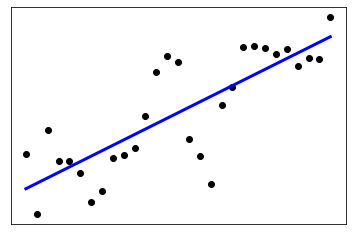

In [138]:
from sklearn.linear_model import LinearRegression
X, y = create_datasource(v_1001)
lin_reg = LinearRegression()
lin_reg.fit(X, y)
pred = lin_reg.predict(X)
print(SMAPE(y, pred))

# Plot outputs
plt.scatter(X, y, color="black")
plt.plot(X, pred, color="blue", linewidth=3)
plt.xticks(())
plt.yticks(())
plt.show()

In [139]:
cfip_0 = X_train[X_train.cfips == 0.0]
cfip_0_target = train_targets[train_targets.cfips == 0.0]['microbusiness_density']
cfip_0_val = X_val[X_val.cfips == 0.0]
cfip_0_val_target = val_targets[val_targets.cfips == 0.0]['microbusiness_density']

In [140]:
cfip_0_val_target

29    3.296781
30    3.334431
31    3.336785
32    3.372082
33    3.313253
34    3.346197
35    3.437971
36    3.423852
37    3.442677
38    3.463856
Name: microbusiness_density, dtype: float64

In [141]:
#Linear Regression
# let's iterate over cfip_0
linreg = LinearRegression()
#fitting inputs
linreg.fit(cfip_0, cfip_0_target)
#Lets Predict
train_preds = linreg.predict(cfip_0)
val_preds = linreg.predict(cfip_0_val)
#Lets scre on SMAPE Parameter
SMAPE(cfip_0_target, train_preds), SMAPE(cfip_0_val_target, val_preds)

(0.0059170434265529, 0.45319866013813104)

**Observation**
The sample tested is for `cfip-1001(0.0 after scaling)` for which we `got 0.0059% SMAPE for seen targets` and for `unknown target we got 0.453% SMAPE Score`

## For seen target

In [142]:
# Let's put prediction in a dataframe and let's try to predict
predict_df = pd.DataFrame()
for cfip in tqdm(X_train['cfips'].unique()):
    
    #lets, prepare inputs and targets
    X_train_inputs = X_train[X_train.cfips == cfip]
    train_target = train_targets[train_targets.cfips == cfip]['microbusiness_density']
    
    #Linear Regression
    linreg = LinearRegression()
    
    #fitting_inputs
    linreg.fit(X_train_inputs, train_target)
    
    # Insert the forecast into the res set
    train_preds = linreg.predict(X_train_inputs)
    preds_df = pd.DataFrame({'cfips': cfip, 'target': train_target,'Predicted':train_preds})
    predict_df = predict_df.append(preds_df, ignore_index=True)
#     new_dataframe[new_dataframe['cfips'] == cfip]['predict'] = linreg.predict(X_train_inputs)

100%|██████████████████████████████████████| 3135/3135 [00:32<00:00, 96.81it/s]


In [143]:
SMAPE(predict_df[predict_df['cfips'] == 0.0]['target'], predict_df[predict_df['cfips'] == 0.0]['Predicted'])

0.0059170434265529

In [144]:
SMAPE(predict_df['target'], predict_df['Predicted'])

0.04484271722637645

This scores are much better than the score given by baseline model, where for only `cfip 1001(0.0 after scaled) is 0.0059` Symeetric-Absolute-Mean-Percentage-Error and after `training over each cfip we get SMAPE 0.0448`.

## For unseen target

In [145]:
# Let's put prediction in a dataframe and let's try to predict and let's see score for validation score
predict_df = pd.DataFrame()
for cfip in tqdm(X_train['cfips'].unique()):
    
    #lets, prepare inputs and targets
    X_train_inputs = X_train[X_train.cfips == cfip]
    train_target = train_targets[train_targets.cfips == cfip]['microbusiness_density']
    #Validation
    X_val_inputs = X_val[X_val.cfips == cfip]
    val_target = val_targets[val_targets.cfips == cfip]['microbusiness_density']
    
    
    #Linear Regression
    linreg = LinearRegression()
    
    #fitting_inputs
    linreg.fit(X_train_inputs, train_target)
    
    # Insert the forecast into the res set
    val_preds = linreg.predict(X_val_inputs)
    preds_df = pd.DataFrame({'cfips': cfip, 'target': val_target,'Predicted':val_preds})
    predict_df = predict_df.append(preds_df, ignore_index=True)
#     new_dataframe[new_dataframe['cfips'] == cfip]['predict'] = linreg.predict(X_train_inputs) -- dosen't work

100%|██████████████████████████████████████| 3135/3135 [00:37<00:00, 83.95it/s]


In [146]:
SMAPE(predict_df['target'], predict_df['Predicted'])

0.9622063727095463

In [147]:
predict_df

,cfips,target,Predicted
0,0.0,3.296781,3.280168
1,0.0,3.334431,3.318284
2,0.0,3.336785,3.320663
3,0.0,3.372082,3.356500
4,0.0,3.313253,3.296764
...,...,...,...
31345,1.0,1.803249,1.823174
31346,1.0,1.803249,1.823152
31347,1.0,1.785396,1.805238
31348,1.0,1.785396,1.805383


Based on the above baselines, we now know that any model we train should have ideally have a `Symeetric mean absolute percentage error lower than 0.045%` and `for untrained data for validation we got 0.962%`. This baseline can also be conveyed to other stakeholders to get a sense of whether the range of loss makes sense. 

Let's create a function and try different Linear Model on it.

In [148]:
def try_model(model):
    predict_df = pd.DataFrame()
    val_predict_df = pd.DataFrame()
    for cfip in tqdm(X_train['cfips'].unique()):
        #lets, prepare inputs and targets for train
        X_train_inputs = X_train[X_train.cfips == cfip]
        train_target = train_targets[train_targets.cfips == cfip]['microbusiness_density']
        
        #lets, prepare inputs and targets for train
        X_val_inputs = X_val[X_val.cfips == cfip]
        val_target = val_targets[val_targets.cfips == cfip]['microbusiness_density']

        #fitting_inputs
        model.fit(X_train_inputs, train_target)

        # Insert the forecast into the rest
        train_preds = model.predict(X_train_inputs)
        val_preds = model.predict(X_val_inputs)
        
        #Insertting into dataframe
        preds_df = pd.DataFrame({'cfips': cfip, 'train_targets': train_target,'train_predicted':train_preds})
        val_df = pd.DataFrame({'cfips' : cfip, 'validation_targets':val_target, 'val_preds':val_preds})
        predict_df = predict_df.append(preds_df, ignore_index=True)
        val_predict_df = val_predict_df.append(val_df, ignore_index = True)
        
    return SMAPE(predict_df['train_targets'], predict_df['train_predicted']), SMAPE(val_predict_df['validation_targets'], val_predict_df['val_preds'])

# Linear Models

Read about linear models here: https://scikit-learn.org/stable/modules/linear_model.html


In [149]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

In [150]:
try_model(LinearRegression(n_jobs=-1, normalize = False, positive = False))

100%|██████████████████████████████████████| 3135/3135 [00:45<00:00, 68.54it/s]


(0.04484271722637645, 0.9622063727095463)

In [151]:
try_model(Ridge(alpha=0.1, random_state=42))

100%|██████████████████████████████████████| 3135/3135 [00:51<00:00, 60.84it/s]


(3.309344416050564, 8.319413275920704)

In [152]:
try_model(Lasso(alpha = 0.01, random_state = 42))

100%|██████████████████████████████████████| 3135/3135 [00:50<00:00, 62.59it/s]


(3.5170306519083927, 7.958607943012053)

In [153]:
try_model(ElasticNet(alpha=0.01,l1_ratio = 0.01, random_state=42))

100%|██████████████████████████████████████| 3135/3135 [00:59<00:00, 52.74it/s]


(3.4296980681061426, 8.121011156793267)

# Tree Based Models

In [155]:
from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text

In [156]:
tree = DecisionTreeRegressor(random_state = 42)
try_model(tree)

100%|██████████████████████████████████████| 3135/3135 [01:07<00:00, 46.54it/s]


(1.8020271611897962e-16, 3.0036149719392866)

In [157]:
tree.tree_.max_depth

6

In [158]:
tree = DecisionTreeRegressor(random_state = 42, max_depth = 5, criterion = 'mae')
try_model(tree)

100%|██████████████████████████████████████| 3135/3135 [01:12<00:00, 43.24it/s]


(0.045489416368710574, 2.968341154476935)

mae : `Train SMAPE 0.045489` and `Val SMAPE 2.968341` whereas mse : `Train SMAPE 0.04280` and `Val SMAPE 3.003891`. This confirms that since we are using SMAPE to score the model best is to use the `Mean Absolute Error` (MAE)

In [159]:
def max_depth(md):
    model = DecisionTreeRegressor(max_depth= md, random_state = 42, criterion = 'mae')
    train_smape, val_smape = try_model(model)
    return {'Max Depth:' : md, 'Training SMAPE:': train_smape, 'Validation SMAPE:': val_smape}

In [160]:
%%time 
depth_df = pd.DataFrame([max_depth(md) for md in range(1,8)])

100%|██████████████████████████████████████| 3135/3135 [00:51<00:00, 60.59it/s]

Wall time: 5min 44s


In [161]:
depth_df

,Max Depth:,Training SMAPE:,Validation SMAPE:
0,1,2.013630,4.895971
1,2,0.923419,3.619548
2,3,0.406715,3.150853
3,4,0.151064,3.015092
4,5,0.045489,2.968341
5,6,0.011897,2.978292
6,7,0.002955,2.968831


In [162]:
depth_df.loc[depth_df['Validation SMAPE:'] == depth_df['Validation SMAPE:'].min()]

,Max Depth:,Training SMAPE:,Validation SMAPE:
4,5,0.045489,2.968341


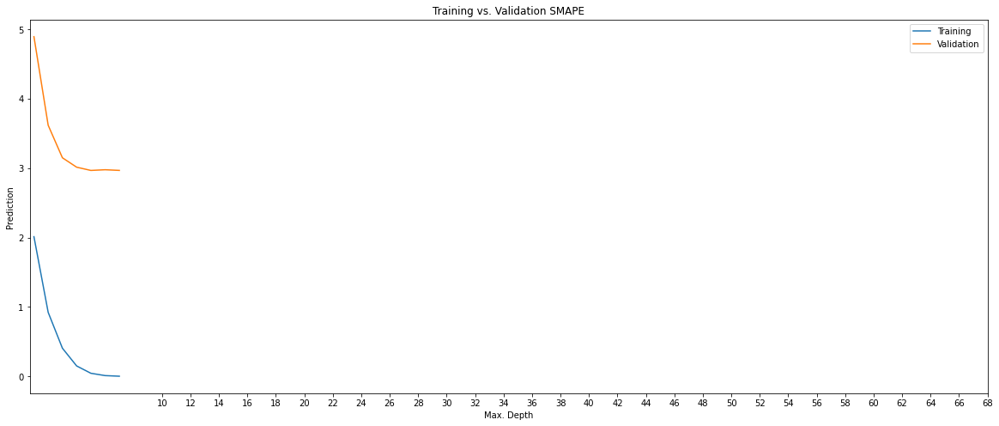

In [163]:
plt.figure(figsize=(20,8))
plt.plot(depth_df['Max Depth:'], depth_df['Training SMAPE:'])
plt.plot(depth_df['Max Depth:'], depth_df['Validation SMAPE:'])
plt.title('Training vs. Validation SMAPE')
plt.xticks(range(10,70, 2))
plt.xlabel('Max. Depth')
plt.ylabel('Prediction')
plt.legend(['Training', 'Validation']);

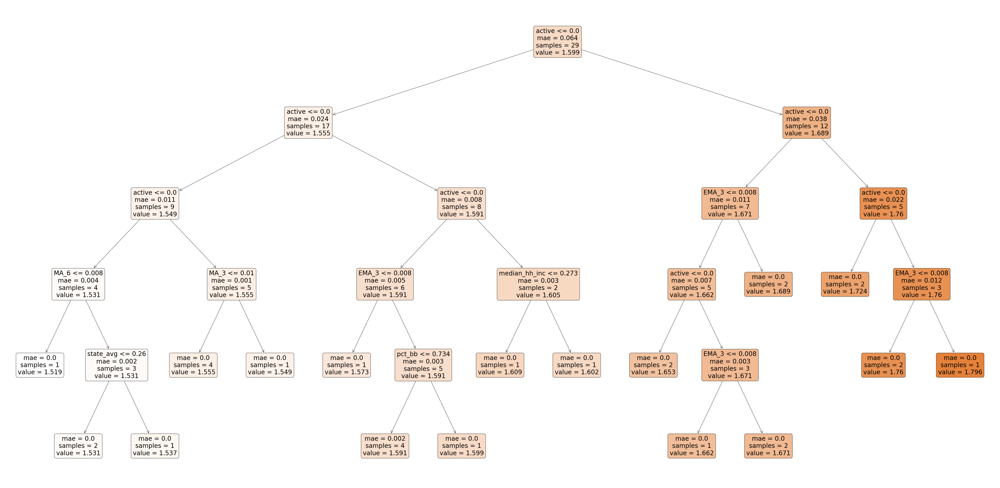

In [164]:
plt.figure(figsize = (80,40))
plot_tree(tree, feature_names = X_train.columns, max_depth = 7, filled = True, rounded= True, fontsize = 28);

In [165]:
tree_text = export_text(tree, max_depth = 7, feature_names = list(X_train.columns))
print(tree_text[:5000])

|--- active <= 0.00
|   |--- active <= 0.00
|   |   |--- active <= 0.00
|   |   |   |--- MA_6 <= 0.01
|   |   |   |   |--- value: [1.52]
|   |   |   |--- MA_6 >  0.01
|   |   |   |   |--- state_avg <= 0.26
|   |   |   |   |   |--- value: [1.53]
|   |   |   |   |--- state_avg >  0.26
|   |   |   |   |   |--- value: [1.54]
|   |   |--- active >  0.00
|   |   |   |--- MA_3 <= 0.01
|   |   |   |   |--- value: [1.55]
|   |   |   |--- MA_3 >  0.01
|   |   |   |   |--- value: [1.55]
|   |--- active >  0.00
|   |   |--- active <= 0.00
|   |   |   |--- EMA_3 <= 0.01
|   |   |   |   |--- value: [1.57]
|   |   |   |--- EMA_3 >  0.01
|   |   |   |   |--- pct_bb <= 0.73
|   |   |   |   |   |--- value: [1.59]
|   |   |   |   |--- pct_bb >  0.73
|   |   |   |   |   |--- value: [1.60]
|   |   |--- active >  0.00
|   |   |   |--- median_hh_inc <= 0.27
|   |   |   |   |--- value: [1.61]
|   |   |   |--- median_hh_inc >  0.27
|   |   |   |   |--- value: [1.60]
|--- active >  0.00
|   |--- active <= 0.00


In [166]:
from sklearn.ensemble import RandomForestRegressor

`n_jobs` allows the random forest to use mutiple parallel workers to train decision trees, and `random_state=42` ensures that the we get the same results for each execution.

In [167]:
%%time 
rf = RandomForestRegressor(n_estimators=500, criterion='mae', max_depth=5, min_samples_split=2,
                           min_samples_leaf=2, random_state=1, n_jobs=-1)
try_model(rf)

100%|████████████████████████████████████| 3135/3135 [1:21:47<00:00,  1.57s/it]

Wall time: 1h 21min 47s


(0.596373242886625, 3.275757059005972)

In [168]:
try_model(rf)

100%|████████████████████████████████████| 3135/3135 [3:53:22<00:00,  4.47s/it]


(0.5963712295897627, 3.275772051855176)

In [169]:
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
import lightgbm as lgb

In [170]:
gbrt = GradientBoostingRegressor(max_depth = 10, n_estimators = 22, n_iter_no_change = 10, learning_rate = 0.05, random_state = 42)

In [171]:
try_model(gbrt)

100%|██████████████████████████████████████| 3135/3135 [01:24<00:00, 37.13it/s]


(2.1490134069927764, 4.504879254654289)

In [172]:
XGB = try_model(xgb.XGBRegressor(n_estimators=500, max_depth=5, min_child_weight=5, gamma=0.1, n_jobs=-1))
XGB

100%|██████████████████████████████████████| 3135/3135 [36:32<00:00,  1.43it/s]


(2.367592230551889, 5.331121092446173)

In [173]:
LGBM = try_model(lgb.LGBMRegressor(n_estimators=500, max_depth=5, min_child_weight=5, n_jobs=-1))
LGBM

100%|██████████████████████████████████████| 3135/3135 [02:42<00:00, 19.33it/s]


(6.153179459572445, 9.002622582898763)

# Predicting test data

Based on the above model the best accuracy we got is for **Linear Model**.

In [174]:
def try_model_test_data(model):
    predict_df = pd.DataFrame()
    val_predict_df = pd.DataFrame()
    test_predict_df = pd.DataFrame()
    for cfip in tqdm(X_train['cfips'].unique()):
        #lets, prepare inputs and targets for train
        X_train_inputs = X_train[X_train.cfips == cfip]
        train_target = train_targets[train_targets.cfips == cfip]['microbusiness_density']
        
        #lets, prepare inputs and targets for train
        X_val_inputs = X_val[X_val.cfips == cfip]
        val_target = val_targets[val_targets.cfips == cfip]['microbusiness_density']
        
        #Unknown target of test data
        X_test_inputs = X_test[X_test.cfips == cfip]

        #fitting_inputs
        model.fit(X_train_inputs, train_target)

        # Insert the forecast into the rest
        train_preds = model.predict(X_train_inputs)
        val_preds = model.predict(X_val_inputs)
        test_preds = model.predict(X_test_inputs)
        
        #Insertting prediction into dataframe by cfips
        preds_df = pd.DataFrame({'cfips': cfip, 'train_targets': train_target,'train_predicted':train_preds})
        val_df = pd.DataFrame({'cfips' : cfip, 'validation_targets':val_target, 'val_preds':val_preds})
        tested_df = pd.DataFrame({'cfips' : cfip, 'test predicted' : test_preds})
        
        # Appending result for each iteration
        predict_df = predict_df.append(preds_df, ignore_index=True)
        val_predict_df = val_predict_df.append(val_df, ignore_index = True)
        test_predict_df = test_predict_df.append(tested_df, ignore_index = True)
        
    return predict_df, val_predict_df, test_predict_df

In [175]:
train_pred, val_pred, test_pred =  try_model_test_data(LinearRegression(n_jobs = -1, ))

100%|██████████████████████████████████████| 3135/3135 [01:02<00:00, 50.18it/s]


In [176]:
smape_train = SMAPE(train_pred['train_targets'], train_pred['train_predicted'])
smape_val = SMAPE(val_pred['validation_targets'], val_pred['val_preds'])
print(smape_train, smape_val)
test_pred

0.04484271722637645 0.9622063727095463


,cfips,test predicted
0,0.0,2.936898
1,0.0,3.040255
2,0.0,2.952271
3,0.0,3.046178
4,0.0,3.042682
...,...,...
25075,1.0,1.708577
25076,1.0,1.737879
25077,1.0,1.702863
25078,1.0,1.744916


# Prediciting on entire train data using TimeSeriesSplit()

**Time Series cross-validator**

Provides train/test indices to split time series data samples that are observed at fixed time intervals, in train/test sets. In each split, test indices must be higher than before, and thus shuffling in cross validator is inappropriate.

`This cross-validation object is a variation of KFold. In the kth split, it returns first k folds as train set and the (k+1)th fold as test set.`

Note that unlike standard cross-validation methods, `successive training sets are supersets of those that come before them`.

Read more in the [User Guide](https://scikit-learn.org/stable/modules/cross_validation.html#time-series-split).

In [177]:
#Let's concate the train and the val data:
concat_df = pd.concat([X_train, X_val], ignore_index=True, axis = 0)
targets_df = pd.concat([train_targets, val_targets], ignore_index=True, axis = 0)

#sort values
concat_df.sort_values(by = ['cfips'], inplace = True)
targets_df.sort_values(by = ['cfips'], inplace = True)

#reset index
concat_df = concat_df.reset_index(drop = True)
targets_df = targets_df.reset_index(drop = True)

In [178]:
targets_df

,cfips,first_day_of_month,microbusiness_density
0,0.0,2019-08-01,3.007682
1,0.0,2021-06-01,3.222288
2,0.0,2021-07-01,3.210433
3,0.0,2021-08-01,3.219917
4,0.0,2021-09-01,3.186722
...,...,...,...
122260,1.0,2019-10-01,1.530794
122261,1.0,2019-09-01,1.530794
122262,1.0,2019-08-01,1.548594
122263,1.0,2022-09-01,1.785396


In [179]:
from sklearn.model_selection import TimeSeriesSplit
def try_model_on_Timeseries(model):
    #lets, prepare inputs and targets for train
    train_X = concat_df
    train_y = targets_df['microbusiness_density']
    
    smape_train = []
    smape_test = []
    
    #define timseriessplit and model name for each iteration
    tscv = TimeSeriesSplit(n_splits=7)
    model_name = model.__class__.__name__
    
    for _, (train_index, test_index) in tqdm(enumerate(tscv.split(X))):
        
        #Preparing inputs and targets
        X_train, X_test = train_X.iloc[train_index], train_X.iloc[test_index]
        y_train, y_test = train_y.iloc[train_index], train_y.iloc[test_index]
        
        #fitting and learning train data
        clf = model.fit(X_train, y_train)
        
        # predicting
        train_preds = clf.predict(X_train)
        test_preds = clf.predict(X_test)
        
        #Scoring the model
        smape = SMAPE(y_train, train_preds)
        smape_tested = SMAPE(y_test, test_preds)
        smape_train.append(smape)
        smape_test.append(smape_tested)
    return model_name, smape_train, smape_test 

In [180]:
try_model_on_Timeseries(LinearRegression(n_jobs = -1))

7it [00:00, 51.85it/s]


('LinearRegression',
 [4.8364479409928344e-12,
  3.427903411913368e-13,
  0.0008072399267791077,
  0.0013697119357027132,
  0.0013624137747044684,
  0.002604229799322927,
  0.003227656066422108],
 [133.84509064542704,
  0.008500117689313792,
  0.01062492658895984,
  0.002774004854606519,
  2.61677255166632,
  0.11855038552293794,
  0.017627049156488127])

In [181]:
def print_smape_score(model):
    # print cv and save the average
    model_name, score_train, score_test = try_model_on_Timeseries(model)
    for i, (r1, r2) in enumerate(zip(score_train, score_test), start=1):
        print(f'{i} FOLDS: {model_name} train smape: {r1:.4f} test smape: {r2:.4f}')
    print(f'\n{model_name} mean train smape: {np.mean(score_train):.4f}  mean test smape: {np.mean(score_test):.4f}')
#     print('='*30)
    return model_name, np.mean(score_train), np.mean(score_test)

In [182]:
print_smape_score(LinearRegression(n_jobs = -1))

7it [00:00, 59.56it/s]

1 FOLDS: LinearRegression train smape: 0.0000 test smape: 133.8451
2 FOLDS: LinearRegression train smape: 0.0000 test smape: 0.0085
3 FOLDS: LinearRegression train smape: 0.0008 test smape: 0.0106
4 FOLDS: LinearRegression train smape: 0.0014 test smape: 0.0028
5 FOLDS: LinearRegression train smape: 0.0014 test smape: 2.6168
6 FOLDS: LinearRegression train smape: 0.0026 test smape: 0.1186
7 FOLDS: LinearRegression train smape: 0.0032 test smape: 0.0176

LinearRegression mean train smape: 0.0013  mean test smape: 19.5171


('LinearRegression', 0.0013387502154443662, 19.517134240129383)

 LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor

In [183]:
print_smape_score(Ridge(alpha = 0.01, random_state = 1, solver = 'auto'))

7it [00:00, 72.92it/s]

1 FOLDS: Ridge train smape: 0.7147 test smape: 2.3901
2 FOLDS: Ridge train smape: 0.8530 test smape: 1.1123
3 FOLDS: Ridge train smape: 0.8023 test smape: 0.9985
4 FOLDS: Ridge train smape: 0.8306 test smape: 0.9604
5 FOLDS: Ridge train smape: 0.8365 test smape: 0.4588
6 FOLDS: Ridge train smape: 0.7888 test smape: 0.6841
7 FOLDS: Ridge train smape: 0.7442 test smape: 0.2968

Ridge mean train smape: 0.7957  mean test smape: 0.9859


('Ridge', 0.7957322593192784, 0.9858541665777188)

In [184]:
print_smape_score(Lasso(alpha = 0.01, random_state = 1, selection = 'cyclic'))

7it [00:00, 82.26it/s]

1 FOLDS: Lasso train smape: 0.7116 test smape: 2.4278
2 FOLDS: Lasso train smape: 1.0769 test smape: 1.5789
3 FOLDS: Lasso train smape: 1.1276 test smape: 0.8340
4 FOLDS: Lasso train smape: 1.0745 test smape: 0.9063
5 FOLDS: Lasso train smape: 1.0391 test smape: 0.8323
6 FOLDS: Lasso train smape: 1.0156 test smape: 2.7152
7 FOLDS: Lasso train smape: 1.1836 test smape: 0.6692

Lasso mean train smape: 1.0327  mean test smape: 1.4234


('Lasso', 1.0326955109688245, 1.4233842711550668)

In [185]:
print_smape_score(ElasticNet(alpha = 0.01, l1_ratio=0.01, random_state= 1, selection='cyclic'))

7it [00:00, 83.33it/s]

1 FOLDS: ElasticNet train smape: 0.7113 test smape: 2.4267
2 FOLDS: ElasticNet train smape: 1.0426 test smape: 1.5198
3 FOLDS: ElasticNet train smape: 1.0680 test smape: 0.6607
4 FOLDS: ElasticNet train smape: 1.0026 test smape: 0.8517
5 FOLDS: ElasticNet train smape: 0.9731 test smape: 0.6653
6 FOLDS: ElasticNet train smape: 0.9298 test smape: 1.8603
7 FOLDS: ElasticNet train smape: 0.9271 test smape: 0.3503

ElasticNet mean train smape: 0.9506  mean test smape: 1.1907


('ElasticNet', 0.9506482391632788, 1.1906840024732037)

In [186]:
print_smape_score(DecisionTreeRegressor(random_state = 1,criterion = 'mae',min_samples_split = 2,   max_depth = 5))

7it [00:00, 87.50it/s]

1 FOLDS: DecisionTreeRegressor train smape: 0.0093 test smape: 2.0828
2 FOLDS: DecisionTreeRegressor train smape: 0.0067 test smape: 0.3458
3 FOLDS: DecisionTreeRegressor train smape: 0.0264 test smape: 0.6102
4 FOLDS: DecisionTreeRegressor train smape: 0.0251 test smape: 0.3350
5 FOLDS: DecisionTreeRegressor train smape: 0.0072 test smape: 1.1751
6 FOLDS: DecisionTreeRegressor train smape: 0.0223 test smape: 1.8926
7 FOLDS: DecisionTreeRegressor train smape: 0.0339 test smape: 0.5631

DecisionTreeRegressor mean train smape: 0.0187  mean test smape: 1.0007


('DecisionTreeRegressor', 0.018700743827626817, 1.0006578780946762)

In [187]:
print_smape_score(RandomForestRegressor(n_estimators= 500, criterion='mse', max_depth=5, min_samples_split=2, random_state=42, n_jobs=-1))

7it [00:11,  1.58s/it]

1 FOLDS: RandomForestRegressor train smape: 0.4647 test smape: 2.8334
2 FOLDS: RandomForestRegressor train smape: 0.5455 test smape: 0.7259
3 FOLDS: RandomForestRegressor train smape: 0.4051 test smape: 0.6317
4 FOLDS: RandomForestRegressor train smape: 0.3287 test smape: 0.3339
5 FOLDS: RandomForestRegressor train smape: 0.2773 test smape: 3.0589
6 FOLDS: RandomForestRegressor train smape: 0.2042 test smape: 2.9345
7 FOLDS: RandomForestRegressor train smape: 0.1784 test smape: 0.9761

RandomForestRegressor mean train smape: 0.3434  mean test smape: 1.6420


('RandomForestRegressor', 0.3434237576597746, 1.6420490820168576)

In [188]:
print_smape_score(GradientBoostingRegressor(max_depth = 5, n_estimators = 500, learning_rate = 0.01, random_state = 42))

7it [00:01,  4.25it/s]

1 FOLDS: GradientBoostingRegressor train smape: 0.0100 test smape: 2.7075
2 FOLDS: GradientBoostingRegressor train smape: 0.0137 test smape: 0.4333
3 FOLDS: GradientBoostingRegressor train smape: 0.0191 test smape: 0.6355
4 FOLDS: GradientBoostingRegressor train smape: 0.0182 test smape: 0.2502
5 FOLDS: GradientBoostingRegressor train smape: 0.0179 test smape: 1.8287
6 FOLDS: GradientBoostingRegressor train smape: 0.0223 test smape: 2.9699
7 FOLDS: GradientBoostingRegressor train smape: 0.0271 test smape: 1.1450

GradientBoostingRegressor mean train smape: 0.0183  mean test smape: 1.4243


('GradientBoostingRegressor', 0.018311207911246002, 1.4242983490534336)

In [189]:
print_smape_score(xgb.XGBRegressor(n_estimators=500, max_depth=5,  random_state=1, n_jobs=-1)) #tried gamma & min_child_weight

7it [00:04,  1.69it/s]

1 FOLDS: XGBRegressor train smape: 0.0144 test smape: 2.1071
2 FOLDS: XGBRegressor train smape: 0.0151 test smape: 1.1403
3 FOLDS: XGBRegressor train smape: 0.0187 test smape: 0.9257
4 FOLDS: XGBRegressor train smape: 0.0146 test smape: 0.4695
5 FOLDS: XGBRegressor train smape: 0.0137 test smape: 1.1967
6 FOLDS: XGBRegressor train smape: 0.0138 test smape: 1.8725
7 FOLDS: XGBRegressor train smape: 0.0183 test smape: 0.4303

XGBRegressor mean train smape: 0.0155  mean test smape: 1.1632


('XGBRegressor', 0.015503580743990008, 1.1631671515516786)

In [190]:
print_smape_score(lgb.LGBMRegressor(n_estimators=500, max_depth=5,  n_jobs=-1, random_state = 1))

7it [00:00, 20.41it/s]

1 FOLDS: LGBMRegressor train smape: 1.5028 test smape: 4.3313
2 FOLDS: LGBMRegressor train smape: 2.0828 test smape: 5.1665
3 FOLDS: LGBMRegressor train smape: 2.9054 test smape: 2.2025
4 FOLDS: LGBMRegressor train smape: 2.7582 test smape: 2.5477
5 FOLDS: LGBMRegressor train smape: 2.7096 test smape: 8.1493
6 FOLDS: LGBMRegressor train smape: 3.3706 test smape: 10.2470
7 FOLDS: LGBMRegressor train smape: 4.0451 test smape: 5.3850

LGBMRegressor mean train smape: 2.7678  mean test smape: 5.4327


('LGBMRegressor', 2.7677857486403785, 5.4327492554054855)

**Observation**

    Linear Regression :  0.0013, 19.5171
    Ridge Regression : 0.7957, 0.9859
    Lasso Regression : 1.0327, 1.4234
    ElasticNet : 0.9506, 1.1907
    Decision-Tree Regressor : 0.0187, 1.0007
    Random Forest Regressor : 0.3434, 1.6420
    Gradient Boosting Regressor : 0.018311207911246002, 1.4242983490534336
    XGB Regressor: 0.015503580743990008, 1.1631671515516786
    LGBM Regressor : 2.7677857486403785, 5.4327492554054855

The best Linear Model is **Ridge Regression Test Score** : `0.9859` , Best tree model we got is for **Decision-Tree Regressor** `1.0007`

# Predicting on Test Data Using TimeSeriesSplit and Best model

In [191]:
len(targets_df['microbusiness_density'])

122265

In [192]:
reg = Ridge(alpha = 0.01, random_state = 42, solver = 'svd')
model, train_score, test_score = print_smape_score(reg)
predict_result = reg.predict(X_test)
len(predict_result)
df = pd.DataFrame(list(zip(test_df['row_id'].values.tolist(), predict_result)),
              columns=['row_id','microbusiness_density'])

7it [00:00, 55.56it/s]


1 FOLDS: Ridge train smape: 0.7147 test smape: 2.3901
2 FOLDS: Ridge train smape: 0.8530 test smape: 1.1123
3 FOLDS: Ridge train smape: 0.8023 test smape: 0.9985
4 FOLDS: Ridge train smape: 0.8306 test smape: 0.9604
5 FOLDS: Ridge train smape: 0.8365 test smape: 0.4588
6 FOLDS: Ridge train smape: 0.7888 test smape: 0.6841
7 FOLDS: Ridge train smape: 0.7442 test smape: 0.2968

Ridge mean train smape: 0.7957  mean test smape: 0.9859


In [193]:
df

,row_id,microbusiness_density
0,1001_2022-11-01,3.368020
1,1001_2022-12-01,3.384722
2,1001_2023-01-01,3.335664
3,1001_2023-02-01,3.378497
4,1001_2023-03-01,3.410808
...,...,...
25075,56045_2023-02-01,3.349487
25076,56045_2023-03-01,3.382207
25077,56045_2023-04-01,3.398151
25078,56045_2023-05-01,3.395101


In [194]:
# calculating coefficients
coeff = pd.DataFrame({'feature' : X_train.columns})
coeff['Weight'] = pd.Series(reg.coef_)
coeff

,feature,Weight
0,cfips,0.000000
1,first_day_of_month,0.000163
2,active,0.000982
3,pct_bb,0.078596
4,pct_college,-0.068722
5,pct_it_workers,0.312264
6,pct_foreign_born,-0.013086
7,median_hh_inc,0.168043
8,national_avg,0.243261
9,state_avg,0.071233


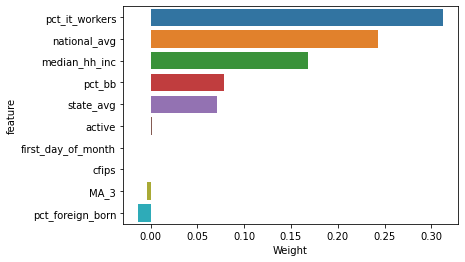

In [195]:
sns.barplot(data = coeff.sort_values('Weight', ascending=False).head(10), x = 'Weight', y = 'feature');

More work to do

In [196]:
# # Train 8 models for each county !!! Please note that this is just a sample code. You Should modify or tweak below parameters to get better performance.
# reg = LinearRegression(n_jobs=-1)
# ridge = Ridge(alpha = 0.01, random_state = 42, solver = 'auto')
# lasso = Lasso(alpha = 0.01, random_state = 42, selection = 'cyclic')
# Enet = ElasticNet(alpha = 0.01, l1_ratio=0.01, random_state=42, selection='cyclic')
# # DTree = DecisionTreeRegressor(max_depth=5, min_samples_split=2, min_samples_leaf=2, random_state=1)
# DTree = DecisionTreeRegressor(random_state = 1,criterion = 'mae', min_samples_split=2, max_depth = 5)
# rf = RandomForestRegressor(n_estimators= 500, criterion='mse', max_depth=5, min_samples_split=2, random_state=42, n_jobs=-1)
# gbr = GradientBoostingRegressor(max_depth = 5, n_estimators = 500, learning_rate = 0.01, random_state = 42)
# model_xgb = xgb.XGBRegressor(n_estimators=500, max_depth=5, min_child_weight=5, gamma=0.1, n_jobs=-1)
# model_lgb = lgb.LGBMRegressor(n_estimators=500, max_depth=5, min_child_weight=5, n_jobs=-1, random_state = 1, learning_rate = 0.01)

In [197]:
# model_list = [reg, ridge, lasso, Enet, DTree, rf, gbr, model_xgb, model_lgb]

In [198]:

# submit_df = pd.DataFrame()
# model_results = {}
# county_and_model = {}

# for i in tqdm(X_test['cfips'].unique().tolist()[:3]):
#     print(f'======================= county {i} modeling =====================')
#     train_X = concat_df[concat_df['cfips'] == i]
#     train_y = targets_df[targets_df['cfips'] == i]['microbusiness_density']
    
#     model_dict = {}
#     for model in [reg, ridge, lasso, Enet, DTree, rf, gbr, model_xgb, model_lgb]:
#         model_name, train_mean_score, test_mean_score = print_smape_score(model)
#         model_dict[model_name] = train_mean_score, test_mean_score
#         model_results[i] = min(model_dict.values())
        
#     final_model = model_list[list(model_dict.keys()).index(min(model_dict, key=model_dict.get))]
    
#     # select testset
#     targets_df
#     county_and_model[i] = min(model_dict, key=model_dict.get)
#     #print(county_and_model)
    
#     predict_result = final_model.predict(X_test).tolist()
    
#     df = pd.DataFrame(list(zip(test_df['row_id'].values.tolist(), predict_result)),
#               columns=['row_id','microbusiness_density'])
#     submit_df = submit_df.append(df)

In [199]:
# model_results

In [200]:
df.to_csv('submission.csv', index=None)

In [201]:
from IPython.display import FileLink

# Doesn't work on Colab, use the file browser instead.
FileLink('submission.csv')

C:\Users\MOHIT\Desktop\Jovian\Python\Projects\Project 3 -  Machine Learning\submission.csv

# Summary

1. We start by loading libararies and necessary packages for the initalizing the data of `Go-Daddy Microbusiness Density` provided with `Training & Test data` 122.265K rows, 7 columns and for test data we've 25k rows, 3 columns. we've been also provided with census data 3142 rows, with different parameters like pct_college, pct_bb, median_hh_income, etc.

2. Train data is provided from 2019-08 to 2022-10 and, Test data is provided from 2022-11 to 2023-06. Census data is from 2017-2021, we have lag of data here.

3. **EDA**
     3.1 Analyzed Microbusinees-density against active users and looks like `high density business county` are having `less active users`.
     
     3.1.1 Then we did groupby on density by county to understand the case and we can see for county `Baldwin we got 11,464 active users` for which micro-business density is `low` and for `Teton County we got 5035 active users` and density is `high`.
     
     3.2 `Microbusiness-Density trend over the period` and density is growing over the year we can see some `short fall during 12-2019 to 2-2020 and again at end of 2020 and starting of 2021`.
     
     3.2.1 Then we did follow up on `moving average over 3 and 6 months` and `smoothens trend` and then we added that as a `seperate column in our train data`.
     
      3.2.2 We also used groupby fuction to add moving average data  and created helper function for test data for the year 2022 onwards as well.
     
     3.3 Started to see `outliers in the data` some state the outlier are `too high like Nevada, South Dakota, Wyoming`. 
     
     3.3.1 `Nevada and Wyoming have huge std-deviation and will try to look which of the county of different state are at ouliers or at bare minimum threshold of 99th perentile`.
         
     3.3.2  Well after seeing the ditribution for each state but high-density state are highly skewed. and afer performing and state `we found that some counties in each state are hihly contributing in increasing density like Carson City, Nevada/ Sheridan County, Wyoming/ Rio Garden County, Colorado`.
     
     3.3 Based on the `above observations it is best that we take national and state average` for the train data and would do the same for test data and add them as new feature using helper function.
     
4. Correlation
     4.1 We performed correlation in which we found that there are `strong correlation for density column with active users, moving average and national average`.
     
     4.2 corelation with census data
         * Pecentage of people with access to broadband connection are increasing every year by 2%.
         *  Percent of youth completing college with a degree are incrasing very steadily.
         *  Percent of foreign born was increasing till 2019 but after that it is decreasing.
         *  Percent of IT workers in US are are decreasing steadily.
         *  Percent of Household income are increasing sharply.
     
     4.3 After that we plotted the correlation for the census data with microbusiness density and `pct_college`, `pct_bb`, `median_hh_income`
     
5. Since we don't have the `census data for the given test date` which comes in year `2022` we've `prdicted`it use `pct_change()` over the years and appliyng taht to last year data to get rough census estmiates.
    
    5.1 We predicted for the year 2022 and 2023 and then merged the census with train and test data on cfips and year.
    
6. Then did Partition of train data into two parts train and validation in validation  we've data for the year 2022 and rest before 2022 is part of train data.

7. Then created `inputs columns` and `target columns` where we have created all numeric columns and date as a part of inputs columns, and targets columns contain `microbusiness_density`, `cfips` & date column.

8. Then used sklearn `SimpleImputer` to impute `NA` values and used `MinMaxScaler` scaled all numeric values to Normalization of 0 & 1.

9. Since Linear Models dosen't accepts the date columns so coverted them to the ordinal.

10. We've used `SMAPE(Symmetric mean absolute percentage error)` to score model beacuse Data Source has asked for same. We've created `Base ML model` for which we got `8.5% SMAPE`.

11. First tested our sklearn LinearRegression model on single cfip code 1001 on unscaled data and SMAPE is 1.81%. Then performed the same analysis in `scaled data trainind data score was 0.00%` and `0.45% for unseen data` which is the best score.

12. Now we run for the entire trainin data for each cfips code in the training data the score we got is 0.04% which is best. for unseen data we got 0.962% which is around 1% difference than from the orignal SMAPE score.

13. Created a helper function `try_model()` in which we treated different Linear Model of scikitlearn `LinearRegression`, `Ridge`, `Lasso`, `Elasticnet`, `SGDRegressor`. The best model SMAPE Score we got is from LinearRegression(). We also trained on `sklearn.tree` linear model `DecisionTreeRegressor` for which the SMAPE Score was 0.04% & 3.00%.

14. Try ensemble method also but the best SMAPE score received was of Linear Regression model. 

15. Then used `TimeSeriesSplit` from sklearn which is tha part of KFold only but does with respects to date column. and Thus **concated** the `X_train` and `X_val` inputs and targets data and then created helper function `try_model_timeseries()` and thus ran and check for different linear model.

16. Best score we got is for **Ridge Regression : 0.7957, 0.9859** so we used the ridge regression to predict the test_data. With Coefficients to focus on is `pct_it_workers - 0.312264`, `national_avg	0.243261`, `median_hh_inc 0.168043`, `pct_bb 0.078596`, `state_avg 0.071233`

# Conclusion

Since we can clearly see that census data has a huge correlations with the microbusiness-density like `median household income`, `percentage of people having Broad Band connection`. county having large density is where percent of people have broadband connection is also high and for highly populated areas the desnity was high as compare to new users only making presence known is the only factor. The most important feature to focus on to increase the business and lessen the revenue in marketing is `Percent IT Workers`, `Median Household Income`, `Percent of Broadband connection` and Microbusiness-density `State average`.

# Refrences
1. https://www.kaggle.com/code/kimtaehun/complete-baseline-code-with-various-ml-model#Modeling-overviews
2. https://www.kaggle.com/code/cdeotte/linear-regression-baseline-lb-1-092#Load-Libraries,-Train,-Test
3. Jovian.com
4. pandas.pydata.org
5. geeksforgeeks.org
6. https://towardsdatascience.com/machine-learning-with-datetime-feature-engineering-predicting-healthcare-appointment-no-shows-5e4ca3a85f96
7. https://www.projectpro.io/recipes/append-output-of-for-loop-python-dataframe
8. https://stackoverflow.com/questions/34214087/how-do-you-access-tree-depth-in-pythons-scikit-learn
9. https://www.kaggle.com/code/gsigalaev/time-series-analysis-godaddy#Train-linear-regression
10. https://www.kaggle.com/code/ttahara/gd-mdf-last-target-baseline
11. https://en.wikipedia.org/wiki/Symmetric_mean_absolute_percentage_error
12. https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html
12. https://scikit-learn.org/stable/modules/cross_validation.html#time-series-split

# Future Work
1. It would be intresting to see the patterns based on county population and BroadBand connction and average age of county.
2. There would be intresting to see wether the following density has exponentialy grown or not up after lockdown and mat want to trace effects of after and during covid period.
3. We can also merge these density data with local market data to reccomend the business to start which will shoot-up. We can aslo do various others recommendations depending on county weather and festival.

In [202]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "mohitdsingh/go-daddy-linearmodel-97cee" on https://jovian.com/
[jovian] Committed successfully! https://jovian.com/mohitdsingh/go-daddy-linearmodel-97cee


'https://jovian.com/mohitdsingh/go-daddy-linearmodel-97cee'

In [203]:
train_raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122265 entries, 0 to 122264
Data columns (total 7 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   row_id                 122265 non-null  object        
 1   cfips                  122265 non-null  int64         
 2   county                 122265 non-null  object        
 3   state                  122265 non-null  object        
 4   first_day_of_month     122265 non-null  datetime64[ns]
 5   microbusiness_density  122265 non-null  float64       
 6   active                 122265 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(3)
memory usage: 7.5+ MB
